In [20]:
import os
import sys
import scipy
sys.path.append(os.path.abspath('../'))
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 200)
pd.set_option('plotting.backend', 'matplotlib')
import qgrid
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))
import seaborn as sns
import logging
import yaml
import base64
from fbprophetGamma import Prophet as ProphetGamma
from fbprophetNB import Prophet as ProphetNB
from fbprophet import Prophet
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import tqdm

import warnings
warnings.filterwarnings("ignore")

DATA_PATH = 'data/processed/processed.parquet'
SALE_DATES = ['2021-09-14', '2020-06-23', '2020-09-15', '2020-11-10',
              '2020-12-15', '2021-01-19', '2021-03-23']

TIME_SERIES_DICT = {
                    'total': 'Популярное направление', 
                    'seat': 'Популярное направление', 
                    'gift_certificate': 'Непопулярное направление', 
                    "('AAQ-DME', 'auto_checkin')": 'Направление с почти нулевым спросом', 
                    "('DME-GDZ', 'auto_checkin')": 'Направление с почти нулевым спросом', 
                    "('DME-ORY', 'seat')": 'Направление с почти нулевым спросом'
                   }

tbl = pd.read_parquet(os.path.join('../', DATA_PATH))
REPORT_FOLDER = ''
OUTPUT_FILE = 'files/scores.csv'

In [21]:
logging.getLogger('fbprophet').setLevel(logging.WARNING)

class suppress_stdout_stderr(object):
    '''
    A context manager for doing a "deep suppression" of stdout and stderr in
    Python, i.e. will suppress all print, even if the print originates in a
    compiled C/Fortran sub-function.
       This will not suppress raised exceptions, since exceptions are printed
    to stderr just before a script exits, and after the context manager has
    exited (at least, I think that is why it lets exceptions through).

    '''
    def __init__(self):
        # Open a pair of null files
        self.null_fds = [os.open(os.devnull, os.O_RDWR) for x in range(2)]
        # Save the actual stdout (1) and stderr (2) file descriptors.
        self.save_fds = [os.dup(1), os.dup(2)]

    def __enter__(self):
        # Assign the null pointers to stdout and stderr.
        os.dup2(self.null_fds[0], 1)
        os.dup2(self.null_fds[1], 2)

    def __exit__(self, *_):
        # Re-assign the real stdout/stderr back to (1) and (2)
        os.dup2(self.save_fds[0], 1)
        os.dup2(self.save_fds[1], 2)
        # Close the null files
        for fd in self.null_fds + self.save_fds:
            os.close(fd)

In [116]:
def make_sales(sale_list=SALE_DATES):
    sales = pd.DataFrame({
            'holiday': 'sale',
            'ds': pd.to_datetime(sale_list),
            'lower_window': 0,
            'upper_window': 4,
        })
    return sales


def validate_anomalies(model, target, anom_params=(0.2, 3, True),
                       test_time_series_duration=len(tbl), to_plot=False, 
                       use_random_init_time=True, use_rolling_window=True, use_naive_sol=True, window_len=1):
    '''
    Return true and predicted by model indexes of anomalies
    model: Prophet or ProphetGamma
    data.columns = ['ds', 'y']
    '''
    anom_coeff, num_anomalies, in_a_row = anom_params
    if not use_rolling_window:
        window_len = 1

    if model == Prophet:
        interval_width = PROPHET_WIDTH
    elif model == ProphetNB:
        interval_width = NB_WIDTH
    elif model == ProphetGamma:
        interval_width = GAMMA_WIDTH
    else:
        interval_width = 0.99
    data = tbl[[target]].reset_index().rename(columns={target: 'y', 'product_creation_date': 'ds'}).copy()

    if use_random_init_time:
        init = np.random.randint(0, 24)
        num_hours = 24 * (1 - anom_coeff)
        init_coeff = 1 - (24 - init) / 24 if (24 - init - num_hours) < 0 else anom_coeff
        extra_hours = abs(24 - init - num_hours) if (24 - init - num_hours) < 0 else 0
        extra_coeff = 1 - extra_hours / 24
    else:
        init_coeff = anom_coeff
        extra_coeff = 1

    if in_a_row:
        start = np.random.randint(test_time_series_duration - num_anomalies - 2)
        art_anomalies = list(np.arange(start, start + num_anomalies))
    else:
        art_anomalies = np.random.choice(test_time_series_duration, num_anomalies, replace=False)
        art_anomalies = list(sorted(art_anomalies))
    art_anomalies.append(art_anomalies[-1] + 1)

    test_time_series = data.y.tolist()[-test_time_series_duration:]

    for i, ind in enumerate(art_anomalies):
        if i == 0:
            test_time_series[ind] = init_coeff * test_time_series[ind]
        elif i == len(art_anomalies) - 1:
            test_time_series[ind] = extra_coeff * test_time_series[ind]
        else:
            test_time_series[ind] = anom_coeff * test_time_series[ind]

    data['y'] = data.y.tolist()[:-test_time_series_duration] + test_time_series
#     if use_rolling_window:
#         data['y'] = data.y.rolling(window=num_anomalies, min_periods=1, center=True).mean()
        
    if use_naive_sol:
        preds = np.where(data.y[-test_time_series_duration:] <= 1e-3)[0]
    else:
        data['y'] = data.y.apply(lambda x: 1e-1 if x < 1e-1 else x)
        data['cap'] = data.y.max()

        m = model(
            weekly_seasonality=True,
            # yearly_seasonality=True,
            holidays=sales,
            interval_width=interval_width,
            seasonality_mode='multiplicative'
        )
        try:
            with suppress_stdout_stderr():
                m.fit(data)
        except:
            print(f'There was a problem with model {model}, target {target}, and params {anom_coeff}, {num_anomalies}')
        forecast = m.predict(data)

        comp = pd.merge(
            forecast,
            data,
            left_on='ds',
            right_on='ds')
        
        #############
        comp = make_interval(model, m, comp, interval_width=interval_width, window_len=1)


        if use_rolling_window:
            # comp['yhat'] = comp.yhat.rolling(window=3, min_periods=1, center=True).mean()
            diffs = comp['y'] - comp['yhat']
            rolls = diffs.rolling(window=window_len, min_periods=1, center=True).mean() + comp['yhat']
            comp['y'] = rolls
            m.history['y'] = rolls #m.history['y'].rolling(window=window_len, min_periods=1, center=True).mean()
            m.history['y'] = m.history['y'].apply(lambda x: 1e-2 if x <= 1e-1 else x)
        ################

        comp.y = comp.y.apply(lambda x: 1e-2 if x <= 1e-1 else x)
        anomalies = comp[(comp.y < comp.yhat_lower)]  # | (comp.y > comp.yhat_upper)]
        anomalies = anomalies[anomalies.ds >= data.ds[-test_time_series_duration:].values[0]]
        if len(anomalies) != 0:
            preds = [np.where(data.ds[-test_time_series_duration:] == x)[0][0] for x in anomalies.ds]
        else:
            preds = []

        if to_plot:
            plt.figure(figsize=(30, 9))
            ax = plt.gca()
            #plt.title(f'{TIME_SERIES_DICT[target]}', fontsize=35)
            m.plot(comp, ax=ax, plot_cap=False, xlabel='')
            plt.ylabel('Продажи', fontsize=30)
            plt.xticks(fontsize=22)
            plt.yticks(fontsize=22)
            if extra_coeff == 1:
                ax.scatter(comp.ds[-test_time_series_duration:].iloc[art_anomalies[:-1]],
                       comp.y[-test_time_series_duration:].iloc[art_anomalies[:-1]], c='g', marker='o', s=80)
            else:
                ax.scatter(comp.ds[-test_time_series_duration:].iloc[art_anomalies],
                           comp.y[-test_time_series_duration:].iloc[art_anomalies], c='g', marker='o', s=80)

            r = data.ds[-test_time_series_duration:].iloc[art_anomalies].tolist()
            for i, x in anomalies.iterrows():
                if x.ds in r:
                    ax.scatter(x.ds, x.y, c='r', marker='o', s=80)
                else:
                    ax.scatter(x.ds, x.y, c='yellow', marker='o', s=80)
            
#             if art_anomalies[0] + 1 > 25 and art_anomalies[0] + 1 < test_time_series_duration - 25:
#                 plt.xlim((comp.ds[art_anomalies[0] + 1] - pd.Timedelta(25, 'D'),
#                           comp.ds[art_anomalies[0] + 1] + pd.Timedelta(25, 'D')))
#                 plt.xticks([comp.ds[art_anomalies[0] + 1] - pd.Timedelta(10, 'D'),
#                           comp.ds[art_anomalies[0] + 1] + pd.Timedelta(10, 'D')])
#             elif art_anomalies[0] + 1 <= 25:
#                 plt.xlim((comp.ds[0], comp.ds[0] + pd.Timedelta(50, 'D')))
#                 plt.xticks([comp.ds[0] + pd.Timedelta(15, 'D'), comp.ds[0] + pd.Timedelta(35, 'D')])
#             elif art_anomalies[0] + 1 >= test_time_series_duration - 25:
#                 plt.xlim((comp.ds.iloc[-1] - pd.Timedelta(50, 'D'), comp.ds.iloc[-1]))
#                 plt.xticks([comp.ds.iloc[-1] - pd.Timedelta(35, 'D'), comp.ds.iloc[-1] - pd.Timedelta(15, 'D')])
            plt.show()

    art_anomalies_fin = [int(x in art_anomalies) for x in range(test_time_series_duration)]
    preds = [int(x in preds) for x in range(test_time_series_duration)]
    
    
    if not use_random_init_time or extra_coeff == 1:
        art_anomalies_fin[art_anomalies[-1]] = 0
    else:
        if preds[art_anomalies[0]] == 1 or preds[art_anomalies[-1]] == 1:
            art_anomalies_fin[art_anomalies[0]], preds[art_anomalies[0]] = 1, 1
            art_anomalies_fin[art_anomalies[-1]], preds[art_anomalies[-1]] = 0, 0
        else:
            art_anomalies_fin[art_anomalies[0]], preds[art_anomalies[0]] = 1, 0
            art_anomalies_fin[art_anomalies[-1]], preds[art_anomalies[-1]] = 0, 0
            
    if num_anomalies > 1 and use_rolling_window:
        is_detected = 0
        for i in range(num_anomalies):
            if preds[art_anomalies[i]] == 1:
                is_detected = 1
                break
        for i in range(1, num_anomalies):
            art_anomalies_fin[art_anomalies[i]], preds[art_anomalies[i]] = 0, 0
        art_anomalies_fin[art_anomalies[0]], preds[art_anomalies[0]] = 1, is_detected
        
    return art_anomalies_fin, preds


def conduct_experiments(model, target, anom_params=(0.2, 3, True),
                        test_time_series_duration=len(tbl), n_experiments=100, window_len=1):
    '''Return confusion matrix for all experimenst'''
    anom_coeff, num_anomalies, in_a_row = anom_params
    actual = []
    preds = []
    if model == Prophet:
        interval_width = PROPHET_WIDTH
    elif model == ProphetNB:
        interval_width = NB_WIDTH
    elif model == ProphetGamma:
        interval_width = GAMMA_WIDTH
    else:
        interval_width = 0.99

    i = 0
    while i < n_experiments:
        try:
            # anomalies, predictions = validate_anomalies(model=model, target=target, anom_coeff=anom_coeff,
            #                                             num_anomalies=num_anomalies, in_a_row=in_a_row,
            #                                             test_time_series_duration=test_time_series_duration)
            anomalies, predictions = validate_anomalies(model=model, target=target, anom_params=[anom_coeff, num_anomalies, in_a_row],
                                                        test_time_series_duration=test_time_series_duration, window_len=window_len)
            i += 1
        except:
            continue
        actual += anomalies
        preds += predictions
    f1 = f1_score(actual, preds)
    precision = precision_score(actual, preds)
    recall = recall_score(actual, preds)
    report = pd.DataFrame(
        [[model.__module__.split(".")[0], str(target), n_experiments, anom_coeff, num_anomalies, in_a_row, interval_width, f1, precision, recall]],
        columns=['model', 'target_col', 'n_experiments', 'anom_coeff', 'num_anomalies', 'in_a_row', 'interval_width', 'f1_score', 'precision', 'recall'])
    if os.path.exists(os.path.join(REPORT_FOLDER, OUTPUT_FILE)):
        report.to_csv(os.path.join(REPORT_FOLDER, OUTPUT_FILE), mode='a', header=False, index=False)
    else:
        report.to_csv(os.path.join(REPORT_FOLDER, OUTPUT_FILE), index=False)
#     cm = confusion_matrix(actual, preds)
#     ConfusionMatrixDisplay(cm).plot()
#     plt.grid()
#     new_dir_name = os.path.join(REPORT_FOLDER,
#                                 f'plots/interval_width={round(interval_width, 3)}/{target}_{num_anomalies}_{round(anom_coeff, 2)}')
#     os.makedirs(new_dir_name, exist_ok=True)
#     plt.savefig(os.path.join(new_dir_name, f'{model.__module__.split(".")[0]}_cm.png'))
#     plt.close()
    
    
sales = make_sales()

In [28]:
def make_interval(model, m, data, interval_width, window_len=1):
    q = (1 - interval_width) / 2
    yhat_lower, yhat_upper = np.zeros(data.shape[0]), np.zeros(data.shape[0])
    
    if model == Prophet:
        sigma = m.params['sigma_obs'][0][0]
        mu = data.yhat
        if window_len == 2:
            mu_prev = mu.shift(-1).fillna(method='ffill')
            mu = (mu + mu_prev) / 2
            sigma = sigma / 2
        if window_len == 3:
            mu_prev = mu.shift(-1).fillna(method='ffill')
            mu_next = mu.shift(1).fillna(method='bfill')
            mu = (mu + mu_next + mu_prev) / 3
            sigma = sigma / 3
        yhat_lower = scipy.stats.norm.ppf(q, loc=mu, scale=sigma * m.y_scale)
        yhat_upper = scipy.stats.norm.ppf(1-q, loc=mu, scale=sigma * m.y_scale)
    elif model == ProphetNB:
        sigma = m.params['sigma_obs'][0][0]
        mu = data.yhat
        phi = 1 / sigma
        n = phi
        p = phi / (mu + phi)
        coeff = window_len
        yhat_lower = scipy.stats.nbinom.ppf(p=p, n=coeff * n, q=q) / coeff
        yhat_upper = scipy.stats.nbinom.ppf(p=p, n=coeff * n, q=1-q) / coeff
    elif model == ProphetGamma:
        alphas = np.log(1 + np.exp(
                data['trend_alpha'] * (1 + data['multiplicative_terms_alpha'])
                + data['additive_terms_alpha']))

        betas = np.log(1 + np.exp(
                data['trend_beta'] * (1 + data['multiplicative_terms_beta'])
                + data['additive_terms_beta']))
        coeff = 1
        if window_len == 2:
            alphas_prev = alphas.shift(-1).fillna(method='ffill')
            alphas = alphas + alphas_prev
            coeff = 1 / 2
        if window_len == 3:
            alphas_prev = alphas.shift(-1).fillna(method='ffill')
            alphas_next = alphas.shift(1).fillna(method='bfill')
            alphas = alphas + alphas_next + alphas_prev
            coeff = 1 / 3
        yhat_lower = scipy.stats.gamma.ppf(q, alphas, scale=1/betas) * m.y_scale * coeff
        yhat_upper = scipy.stats.gamma.ppf(1-q, alphas, scale=1/betas) * m.y_scale * coeff
    else:
        NotImplementedError()
        
    data['yhat_lower'] = yhat_lower
    data['yhat_upper'] = yhat_upper
    return data

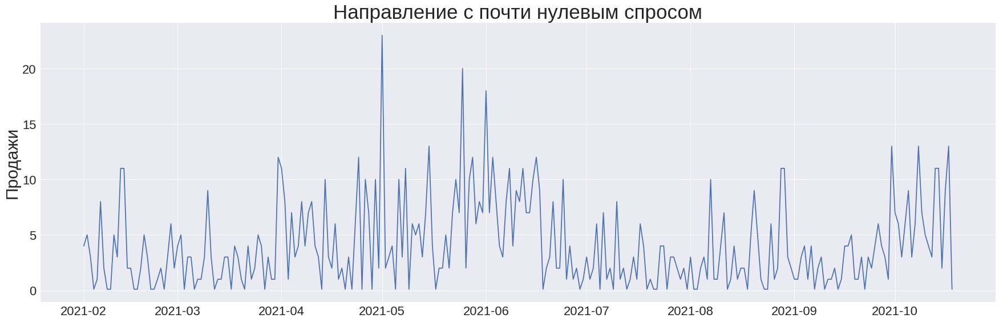

In [6]:
target = "('DME-ORY', 'seat')" #"('DME-ORY', 'seat')", 'total', 'gift_certificate'

data = tbl[[target]].reset_index().rename(columns={target: 'y', 'product_creation_date': 'ds'}).copy()
data['y'] = data.y.apply(lambda x: 1e-1 if x < 1e-1 else x)
data['cap'] = data.y.max()


plt.figure(figsize=(30, 9))
ax = plt.gca()
plt.title(f'{TIME_SERIES_DICT[target]}', fontsize=35)
ax.plot(data.ds, data.y)
plt.ylabel('Продажи', fontsize=30)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.show()

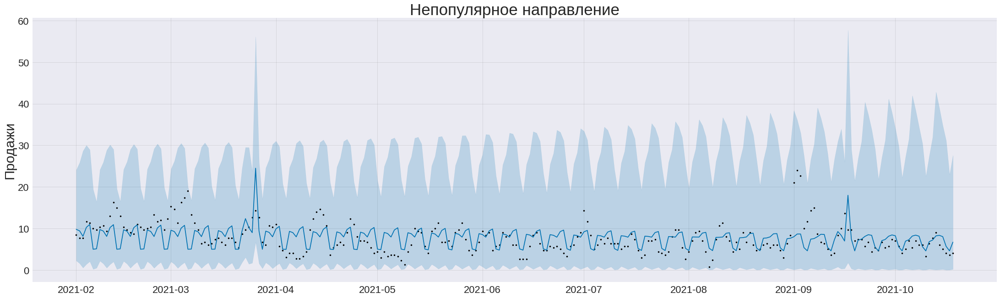

In [54]:
target = "gift_certificate" #"('DME-ORY', 'seat')", 'total', 'gift_certificate'
model = ProphetGamma
interval_width = 0.99
use_rolling_window = True


data = tbl[[target]].reset_index().rename(columns={target: 'y', 'product_creation_date': 'ds'}).copy()
data['y'] = data.y.apply(lambda x: 1e-1 if x < 1e-1 else x)
data['cap'] = data.y.max()

m = model(
    weekly_seasonality=True,
    #yearly_seasonality=True,
    holidays=sales,
    interval_width=interval_width,
    seasonality_mode='multiplicative',
    #mcmc_samples=100,
)

with suppress_stdout_stderr():
    m.fit(data)

forecast = m.predict(data)

comp = pd.merge(
        forecast,
        data,
        left_on='ds',
        right_on='ds')


comp = make_interval(model, m, comp, interval_width=interval_width, window_len=1)


if use_rolling_window:
    # comp['yhat'] = comp.yhat.rolling(window=3, min_periods=1, center=True).mean()
    comp['y'] = comp.y.rolling(window=3, min_periods=1, center=True).mean()
    m.history['y'] = m.history['y'].rolling(window=3, min_periods=1, center=True).mean()


plt.figure(figsize=(30, 9))
ax = plt.gca()
plt.title(f'{TIME_SERIES_DICT[target]}', fontsize=35)
m.plot(comp, ax=ax, plot_cap=False, xlabel='')
plt.ylabel('Продажи', fontsize=30)
#plt.xlabel('', fontsize=25)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
# plt.xlim((comp.ds[0], comp.ds[0] + pd.Timedelta(50, 'D')))
# plt.xticks([comp.ds[0] + pd.Timedelta(15, 'D'), comp.ds[0] + pd.Timedelta(35, 'D')])
plt.show()

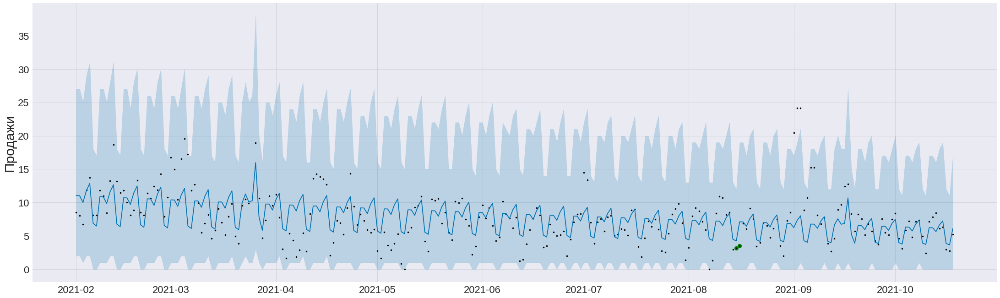

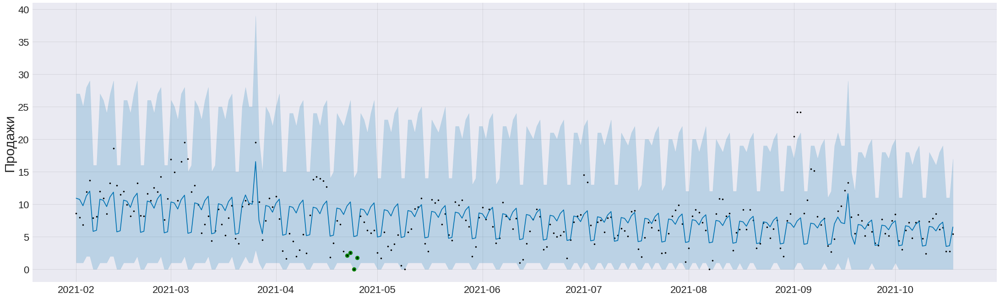

In [118]:
target = "gift_certificate" #"('DME-ORY', 'seat')", 'total', 'gift_certificate'
model = ProphetNB
scenarios = [#{'anom_coeff': 0.833,
#               'num_anomalies': 1,
#               'in_a_row': False
#              },
#              {'anom_coeff': 0.66,
#               'num_anomalies': 1,
#               'in_a_row': False
#              },
             {'anom_coeff': 0,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 3,
              'in_a_row': True
             }
]

PROPHET_WIDTH = 0.99
GAMMA_WIDTH = 0.99
NB_WIDTH = 0.99
use_rolling_window = True

for s in scenarios:
    _ = validate_anomalies(model, target, anom_params=s.values(),
                       test_time_series_duration=len(tbl), to_plot=True, 
                       use_random_init_time=True, use_rolling_window=use_rolling_window, use_naive_sol=False, window_len=3)

# Загрузка данных
Отрезаем, начиная с 1 июня 2021

In [2]:
start_date = '2021-02-01'
df = pd.read_parquet('df.parquet')

df=df[df.product_creation_date>=start_date]
stats = pd.read_parquet('stats.parquet')
stats.loc[:, 'product_creation_date'] = pd.to_datetime(stats.product_creation_date)
stats=stats[stats.product_creation_date>start_date]
segments_sold_per_day = stats.groupby('product_creation_date')['sum_seg_count'].agg('sum')
segments_sold_per_day.plot()

FileNotFoundError: [Errno 2] No such file or directory: 'df.parquet'

In [3]:
all_products = df.product_type.value_counts()

NameError: name 'df' is not defined

На графике суммарных продаж пассажиросегментов видно недельные тренды + распродажу от 12 сентября
# Фильтруем редкие группы

Назначаем вместо пустот в departure и arrival — XXX

Оставляем группы, где есть хотя бы 1000 продаж за рассматриваемый период

In [4]:
df=df[df.product_creation_date<df.product_creation_date.max()]

for col in df.columns:
    print(col, sum(df[col].isna()))

df['departure'] = df['departure'].fillna('XXX')
df['arrival'] = df['arrival'].fillna('XXX')
df['pos']=df['pos'].fillna('Undefined')

df['ond']=df.departure+'-'+df.arrival

df = df.groupby(['product_type','product_creation_date','ond'])[['sum_price','sum_quantity','count_rows']].agg('sum').reset_index()

tracked_pairs = df.groupby(['product_type','ond'])['sum_quantity'].agg('sum')
tracked_pairs = tracked_pairs[tracked_pairs>1000].reset_index()

product_type 0
product_creation_date 0
departure 9707
arrival 9707
pos 91038
sum_price 0
sum_quantity 0
count_rows 0


In [5]:
tracked_products = set(tracked_pairs.product_type)
tracked_onds = set(tracked_pairs.ond)

In [6]:
df.groupby(['product_type','ond'])['sum_quantity'].agg('sum')[
    (df.groupby(['product_type','ond'])['sum_quantity'].agg('sum') < 1000)].reset_index()

,product_type,ond,sum_quantity
0,auto_checkin,AAQ-IWA,72
1,auto_checkin,AAQ-LPK,62
2,auto_checkin,AAQ-OVB,284
3,auto_checkin,ABA-DME,120
4,auto_checkin,ABA-OVB,34
...,...,...,...
5481,upgrade,VVO-UUS,128
5482,upgrade,VVO-YKS,33
5483,upgrade,YKS-DME,269
5484,upgrade,YKS-OVB,308


In [7]:
tracked_pairs

,product_type,ond,sum_quantity
0,aeroexpress,XXX-XXX,126777
1,auto_checkin,AAQ-DME,1365
2,auto_checkin,AER-DME,2894
3,auto_checkin,DME-AAQ,1212
4,auto_checkin,DME-AER,2643
...,...,...,...
685,upgrade,LED-OVB,1338
686,upgrade,OVB-AER,1236
687,upgrade,OVB-DME,1839
688,upgrade,OVB-LED,1307


Назначаем неотслеживаемым продуктам — 'other', а неотслеживаемым направлениям — 'XXX-XXX'

In [8]:
df.loc[~df.product_type.isin(tracked_products),'product_type'] = 'other'
df.loc[~df.ond.isin(tracked_onds),'ond'] = 'XXX-XXX'
df = df.groupby(['product_type','product_creation_date','ond'])[['sum_price','sum_quantity','count_rows']].agg('sum').reset_index()

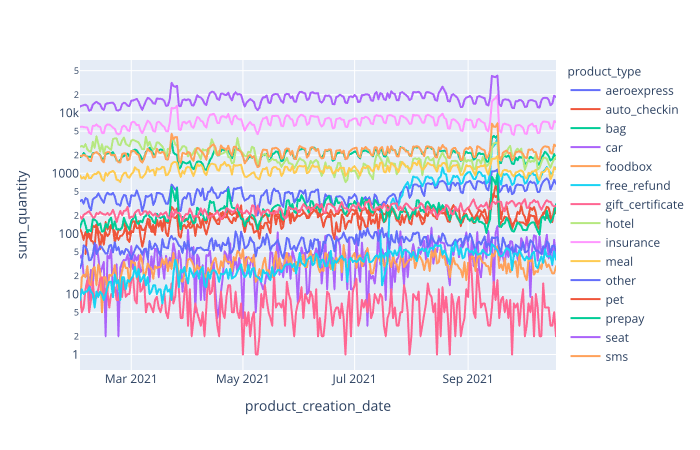

In [9]:
untracked_ids = df.join(tracked_pairs.set_index(['product_type','ond']).rename(columns={'sum_quantity':'is_tracked'}), on=['product_type','ond'])['is_tracked'].isna()

df.loc[untracked_ids,'ond']='XXX-XXX'
df = df.groupby(['product_type','product_creation_date','ond'])[['sum_price','sum_quantity','count_rows']].agg('sum').reset_index()

d1 = df.groupby(['product_type','product_creation_date'])['sum_quantity'].agg('sum').reset_index()

import plotly.express as px
fig = px.line(d1, x='product_creation_date', y='sum_quantity', color='product_type', log_y=True)
fig.update_layout(width=1500, height=500)
fig.show(renderer='svg')

In [10]:
onds = set(df.ond)

tbl_detailed = df.groupby(['product_creation_date','product_type','ond'])['sum_quantity'].agg(sum).unstack().unstack().fillna(0)
tbl_detailed.columns = [tuple(c) for c in tbl_detailed.columns]
pairs_to_drop = tbl_detailed.sum(axis=0)
pairs_to_drop =pairs_to_drop[pairs_to_drop==0].index
tbl_detailed = tbl_detailed.drop(columns=pairs_to_drop)

# Объединяем всё в итоговую таблицу tbl
tbl = d1.set_index(['product_creation_date','product_type']).unstack().fillna(0)
cols = [c[1] for c in tbl.columns]
tbl.columns = cols
tbl_total = tbl.loc[:, cols].sum(axis=1).rename('total')
tbl = pd.concat([tbl_total,segments_sold_per_day, tbl, tbl_detailed], axis=1)

tbl = tbl[:-7]

# Добавляем информацию по распродажам в формате fbprophet

In [11]:
sales = pd.DataFrame({
  'holiday': 'sale',
  'ds': pd.to_datetime(['2021-09-14', '2020-06-23','2020-09-15', '2020-11-10', '2020-12-15','2021-01-19', '2021-03-23']),
  'lower_window': 0,
  'upper_window': 4,
})
import datetime
sale_dates=[]
for _, row in sales.iterrows():
    for shift in range(row.lower_window, row.upper_window+1):
        sale_dates.append(row.ds+datetime.timedelta(days=shift))

In [13]:
class suppress_stdout_stderr(object):
    '''
    A context manager for doing a "deep suppression" of stdout and stderr in
    Python, i.e. will suppress all print, even if the print originates in a
    compiled C/Fortran sub-function.
       This will not suppress raised exceptions, since exceptions are printed
    to stderr just before a script exits, and after the context manager has
    exited (at least, I think that is why it lets exceptions through).

    '''
    def __init__(self):
        # Open a pair of null files
        self.null_fds = [os.open(os.devnull, os.O_RDWR) for x in range(2)]
        # Save the actual stdout (1) and stderr (2) file descriptors.
        self.save_fds = [os.dup(1), os.dup(2)]

    def __enter__(self):
        # Assign the null pointers to stdout and stderr.
        os.dup2(self.null_fds[0], 1)
        os.dup2(self.null_fds[1], 2)

    def __exit__(self, *_):
        # Re-assign the real stdout/stderr back to (1) and (2)
        os.dup2(self.save_fds[0], 1)
        os.dup2(self.save_fds[1], 2)
        # Close the null files
        for fd in self.null_fds + self.save_fds:
            os.close(fd)

In [14]:
a = (tbl < 15).sum() / len(tbl) > 0.95
low_data_cols = a[a].index[1:-1]

In [16]:
tbl

,total,sum_seg_count,aeroexpress,auto_checkin,bag,car,foodbox,free_refund,gift_certificate,hotel,insurance,meal,other,pet,prepay,seat,sms,transfer,upgrade,"(AAQ-DME, auto_checkin)","(AAQ-DME, bag)","(AAQ-DME, meal)","(AAQ-DME, seat)","(AAQ-DME, sms)","(AAQ-IWA, seat)","(AAQ-LPK, seat)","(AAQ-OVB, bag)","(AAQ-OVB, seat)","(AAQ-OVB, sms)","(ABA-DME, bag)","(ABA-DME, meal)","(ABA-DME, seat)","(ABA-DME, sms)","(ABA-OVB, seat)","(AER-DME, auto_checkin)","(AER-DME, bag)","(AER-DME, meal)","(AER-DME, pet)","(AER-DME, seat)","(AER-DME, sms)","(AER-DME, upgrade)","(AER-IKT, bag)","(AER-IKT, seat)","(AER-IWA, seat)","(AER-KRO, seat)","(AER-LPK, seat)","(AER-OVB, bag)","(AER-OVB, meal)","(AER-OVB, seat)","(AER-OVB, sms)","(AER-OVB, upgrade)","(AGP-DME, seat)","(ALC-DME, bag)","(ALC-DME, seat)","(ASF-DME, bag)","(ASF-DME, meal)","(ASF-DME, seat)","(ASF-DME, sms)","(AYT-DME, bag)","(AYT-DME, meal)","(AYT-DME, seat)","(AYT-DME, sms)","(AYT-OVB, seat)","(BAX-DME, bag)","(BAX-DME, meal)","(BAX-DME, seat)","(BAX-DME, sms)","(BAX-OVB, seat)","(BCN-DME, bag)","(BCN-DME, seat)","(BER-DME, seat)","(BJV-DME, seat)","(BLQ-DME, seat)","(BOJ-DME, bag)","(BOJ-DME, meal)","(BOJ-DME, seat)","(BOJ-DME, sms)","(BQS-DME, bag)","(BQS-DME, seat)","(BQS-DME, sms)","(BQS-OVB, meal)","(BQS-OVB, seat)","(BQS-OVB, sms)","(BTK-DME, bag)","(BTK-DME, seat)","(BTK-DME, sms)","(BTK-OVB, seat)","(BZK-DME, seat)","(CEK-DME, bag)","(CEK-DME, meal)","(CEK-DME, seat)","(CEK-DME, sms)","(CEK-OVB, seat)","(CMN-DME, seat)","(DLM-DME, seat)","(DME-AAQ, auto_checkin)","(DME-AAQ, bag)","(DME-AAQ, meal)","(DME-AAQ, seat)","(DME-AAQ, sms)",...,"(SIP-DME, bag)","(SIP-DME, meal)","(SIP-DME, pet)","(SIP-DME, seat)","(SIP-DME, sms)","(SIP-DME, upgrade)","(SIP-IKT, seat)","(SIP-IWA, seat)","(SIP-KRO, seat)","(SIP-LPK, seat)","(SIP-OVB, bag)","(SIP-OVB, seat)","(SIP-OVB, sms)","(SIP-PKV, seat)","(SKG-DME, seat)","(SPU-DME, seat)","(SSH-DME, seat)","(STW-DME, bag)","(STW-DME, seat)","(STW-DME, sms)","(SVX-DME, bag)","(SVX-DME, meal)","(SVX-DME, seat)","(SVX-DME, sms)","(SVX-OVB, bag)","(SVX-OVB, seat)","(SVX-OVB, sms)","(TJM-OVB, seat)","(TLK-OVB, seat)","(TOF-DME, bag)","(TOF-DME, meal)","(TOF-DME, seat)","(TOF-DME, sms)","(UFA-DME, bag)","(UFA-DME, meal)","(UFA-DME, seat)","(UFA-DME, sms)","(UFA-OVB, seat)","(ULV-DME, seat)","(UUD-DME, bag)","(UUD-DME, meal)","(UUD-DME, seat)","(UUD-DME, sms)","(UUD-OVB, bag)","(UUD-OVB, seat)","(UUD-OVB, sms)","(UUS-OVB, bag)","(UUS-OVB, seat)","(UUS-OVB, sms)","(UUS-VVO, bag)","(UUS-VVO, seat)","(UUS-VVO, sms)","(VAR-DME, bag)","(VAR-DME, seat)","(VAR-DME, sms)","(VIE-DME, seat)","(VOG-DME, bag)","(VOG-DME, meal)","(VOG-DME, seat)","(VOG-DME, sms)","(VOG-OVB, seat)","(VOZ-DME, bag)","(VOZ-DME, seat)","(VOZ-DME, sms)","(VOZ-OVB, seat)","(VRN-DME, seat)","(VVO-IKT, seat)","(VVO-KJA, seat)","(VVO-OVB, bag)","(VVO-OVB, meal)","(VVO-OVB, seat)","(VVO-OVB, sms)","(VVO-PKC, bag)","(VVO-PKC, seat)","(VVO-UUS, bag)","(VVO-UUS, seat)","(VVO-UUS, sms)","(XXX-XXX, aeroexpress)","(XXX-XXX, auto_checkin)","(XXX-XXX, bag)","(XXX-XXX, car)","(XXX-XXX, foodbox)","(XXX-XXX, free_refund)","(XXX-XXX, gift_certificate)","(XXX-XXX, hotel)","(XXX-XXX, insurance)","(XXX-XXX, meal)","(XXX-XXX, other)","(XXX-XXX, pet)","(XXX-XXX, prepay)","(XXX-XXX, seat)","(XXX-XXX, sms)","(XXX-XXX, transfer)","(XXX-XXX, upgrade)","(YKS-DME, seat)","(YKS-DME, sms)","(YKS-OVB, bag)","(YKS-OVB, meal)","(YKS-OVB, seat)","(YKS-OVB, sms)"
product_creation_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-02-01,26975.0,NaN,344.0,0.0,1849.0,40.0,6.0,0.0,12.0,2757.0,5871.0,923.0,27.0,120.0,126.0,12750.0,1947.0,8.0,195.0,0.0,10.0,4.0,107.0,14.0,3.0,0.0,3.0,14.0,2.0,3.0,1.0,20.0,4.0,9.0,0.0,321.0,79.0,4.0,936.0,81.0,5.0,8.0,19.0,0.0,0.0,3.0,20.0,9.0,153.0,14.0,6.0,12.0,4.0,19.0,6.0,3.0,42.0,6.0,10.0,9.0,65.0,8.0,2.0,3.0,6.0,46.0,7.0,16.0,4.0,18

In [18]:
from sklearn.metrics import confusion_matrix, f1_score, ConfusionMatrixDisplay
import logging
logging.getLogger('fbprophet').setLevel(logging.WARNING)

PROPHET_WIDTH = 0.995
GAMMA_WIDTH = 0.91
NB_WIDTH = 0.97

def validate_anomalies(model, target, anom_coeff=0.2, num_anomalies=3, in_a_row=True, test_time_series_duration=len(tbl), to_plot=False, use_random_init_time=True):
    '''
    Return true and predicted by model indexes of anomalies
    model: Prophet or ProphetGamma
    data.columns = ['ds', 'y']
    '''
    
    if model == Prophet:
        interval_width = PROPHET_WIDTH
    elif model == ProphetNB:
        interval_width = NB_WIDTH
    elif model == ProphetGamma:
        interval_width = GAMMA_WIDTH
    data = tbl[[target]].reset_index().rename(columns={target:'y', 'product_creation_date':'ds'}).copy()
    
    if use_random_init_time:
        init = np.random.randint(0, 24)
        num_hours = 24 * (1 - anom_coeff)
        init_coeff = 1 - (24 - init) / 24 if (24 - init - num_hours) < 0 else anom_coeff 
        extra_hours = abs(24 - init - num_hours) if (24 - init - num_hours) < 0 else 0
        extra_coeff = 1 - extra_hours / 24
    else:
        init_coeff = anom_coeff
        extra_coeff = 1
    
    if in_a_row:
        start = np.random.randint(test_time_series_duration - num_anomalies)
        art_anomalies = list(np.arange(start, start + num_anomalies))
    else:
        art_anomalies = np.random.choice(test_time_series_duration, num_anomalies, replace=False)
        art_anomalies = list(sorted(art_anomalies))
    art_anomalies.append(art_anomalies[-1] + 1)
    
    test_time_series = data.y.tolist()[-test_time_series_duration:]
    
    for i, ind in enumerate(art_anomalies):
        if i == 0:
            test_time_series[ind] = init_coeff * test_time_series[ind]
        elif i == len(art_anomalies) - 1:
            test_time_series[ind] = extra_coeff * test_time_series[ind]
        else:
            test_time_series[ind] = anom_coeff * test_time_series[ind]
    
    data['y'] = data.y.tolist()[:-test_time_series_duration] + test_time_series
    data['y'] = data.y.apply(lambda x: 1e-1 if x < 1e-1 else x)
    data['cap'] = data.y.max()
    
    m = model(
        weekly_seasonality = True,
        #yearly_seasonality=True,
        holidays=sales,
        interval_width=interval_width,
        seasonality_mode='multiplicative'
    )
    with suppress_stdout_stderr():
        m.fit(data)
    forecast = m.predict(data)

    comp = pd.merge(
        forecast[['ds','yhat_lower', 'yhat_upper', 'yhat']],
        data,
        left_on='ds',
        right_on='ds')

    comp.y = data.y.apply(lambda x: 1e-3 if x == 1e-1 else x)
    anomalies = comp[(comp.y < comp.yhat_lower)] # | (comp.y > comp.yhat_upper)]
    anomalies = anomalies[anomalies.ds >= data.ds[-test_time_series_duration:].values[0]]
    if len(anomalies) != 0:
        preds = [np.where(data.ds[-test_time_series_duration:] == x)[0][0] for x in anomalies.ds]
    else:
        preds = []
    
    if to_plot:
        plt.figure(figsize=(30,9))
        ax=plt.gca()
        plt.title(f'{target}', fontsize=20)
        fig = m.plot(forecast, ax=ax, plot_cap=False)
        ax.scatter(data.ds[-test_time_series_duration:].iloc[art_anomalies], 
                   data.y[-test_time_series_duration:].iloc[art_anomalies], c='g', marker='o', s=80)
        
        r = data.ds[-test_time_series_duration:].iloc[art_anomalies].tolist()
        for i, x in anomalies.iterrows():
            if x.ds in r:
                ax.scatter(x.ds, x.y, c='r', marker='o', s=80)
        os.makedirs(f'./plots_random_start/{target}_{num_anomalies}_{round(anom_coeff, 2)}',exist_ok=True)
        plt.savefig(f'./plots_random_start/{target}_{num_anomalies}_{round(anom_coeff, 2)}/{model.__module__.split(".")[0]}_{target}.png')
        
        
    art_anomalies_fin = [int(x in art_anomalies) for x in range(test_time_series_duration)]
    preds = [int(x in preds) for x in range(test_time_series_duration)]
    if not use_random_init_time or extra_coeff == 1:
        art_anomalies_fin[art_anomalies[-1]] = 0
    else:
        guess_mark = False
        if preds[art_anomalies[0]] == 1 or preds[art_anomalies[-1]] == 1:
            art_anomalies_fin[art_anomalies[0]], preds[art_anomalies[0]] = 1, 1
            art_anomalies_fin[art_anomalies[-1]], preds[art_anomalies[-1]] = 0, 0
        else:
            art_anomalies_fin[art_anomalies[0]], preds[art_anomalies[0]] = 1, 0
            art_anomalies_fin[art_anomalies[-1]], preds[art_anomalies[-1]] = 0, 0
        
    return art_anomalies_fin, preds


def conduct_experiments(model, target, anom_coeff=0.2, num_anomalies=3, in_a_row=False, test_time_series_duration=len(tbl), n_experiments=100):
    '''Return confusion matrix for all experimenst'''
    actual = []
    preds = []
    if model == Prophet:
        interval_width = PROPHET_WIDTH
    elif model == ProphetNB:
        interval_width = NB_WIDTH
    elif model == ProphetGamma:
        interval_width = GAMMA_WIDTH
    
    i = 0
    while i < n_experiments:
        try:
            anomalies, predictions = validate_anomalies(model=model, target=target, anom_coeff=anom_coeff, num_anomalies=num_anomalies, in_a_row=in_a_row,
                                                   test_time_series_duration=test_time_series_duration)
            i += 1
        except:
            continue
        actual += anomalies
        preds += predictions
    f1 = f1_score(actual, preds)
    report = pd.DataFrame([[model.__module__.split(".")[0], str(target), anom_coeff, num_anomalies, in_a_row, interval_width, f1]], 
                          columns=['model', 'target_col', 'anom_coeff', 'num_anomalies', 'in_a_row', 'interval_width', 'f1_score'])
    if os.path.exists('./f1_reports_random_start.csv'):
        report.to_csv('./f1_reports_random_start.csv', mode='a', header=False, index=False)
    else:
        report.to_csv('./f1_reports_random_start.csv', index=False)
    cm = confusion_matrix(actual, preds)
    ConfusionMatrixDisplay(cm).plot()
    plt.grid()
    plt.savefig(f'./plots_random_start/{target}_{num_anomalies}_{round(anom_coeff, 2)}/{model.__module__.split(".")[0]}_confusion_matrix.png')

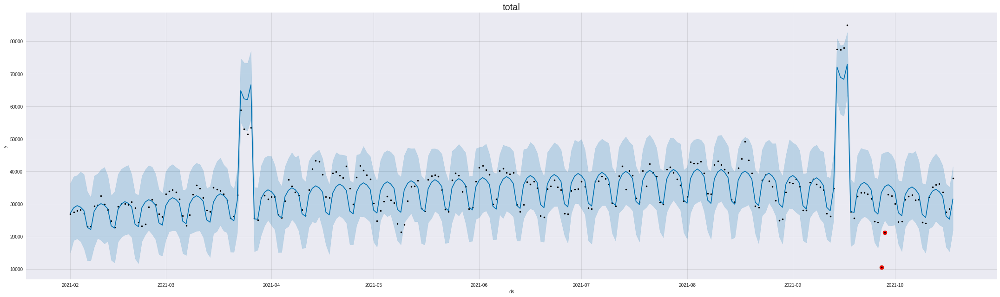

In [21]:
target = 'total'
#data = tbl[[target]].reset_index().rename(columns={target:'y', 'product_creation_date':'ds'})
validate_anomalies(Prophet, target, anom_coeff=0, num_anomalies=1, to_plot=True);
# 1 аномалия ( не 0, а доля)
# Сколько должна не работать система, чтобы мы могли замечать
# оптимальный interval_width,
# гамма интересна, где много нулей. Сколько дней подряд тут аномалия должна быть, чтобы ее заметили
# план диплома + литература - методы поиска аномалий

In [18]:
tbl

,total,sum_seg_count,aeroexpress,auto_checkin,bag,car,foodbox,free_refund,gift_certificate,hotel,insurance,meal,other,pet,prepay,seat,sms,transfer,upgrade,"(AAQ-DME, auto_checkin)","(AAQ-DME, bag)","(AAQ-DME, meal)","(AAQ-DME, seat)","(AAQ-DME, sms)","(AAQ-IWA, seat)","(AAQ-LPK, seat)","(AAQ-OVB, bag)","(AAQ-OVB, seat)","(AAQ-OVB, sms)","(ABA-DME, bag)","(ABA-DME, meal)","(ABA-DME, seat)","(ABA-DME, sms)","(ABA-OVB, seat)","(AER-DME, auto_checkin)","(AER-DME, bag)","(AER-DME, meal)","(AER-DME, pet)","(AER-DME, seat)","(AER-DME, sms)","(AER-DME, upgrade)","(AER-IKT, bag)","(AER-IKT, seat)","(AER-IWA, seat)","(AER-KRO, seat)","(AER-LPK, seat)","(AER-OVB, bag)","(AER-OVB, meal)","(AER-OVB, seat)","(AER-OVB, sms)","(AER-OVB, upgrade)","(AGP-DME, seat)","(ALC-DME, bag)","(ALC-DME, seat)","(ASF-DME, bag)","(ASF-DME, meal)","(ASF-DME, seat)","(ASF-DME, sms)","(AYT-DME, bag)","(AYT-DME, meal)","(AYT-DME, seat)","(AYT-DME, sms)","(AYT-OVB, seat)","(BAX-DME, bag)","(BAX-DME, meal)","(BAX-DME, seat)","(BAX-DME, sms)","(BAX-OVB, seat)","(BCN-DME, bag)","(BCN-DME, seat)","(BER-DME, seat)","(BJV-DME, seat)","(BLQ-DME, seat)","(BOJ-DME, bag)","(BOJ-DME, meal)","(BOJ-DME, seat)","(BOJ-DME, sms)","(BQS-DME, bag)","(BQS-DME, seat)","(BQS-DME, sms)","(BQS-OVB, meal)","(BQS-OVB, seat)","(BQS-OVB, sms)","(BTK-DME, bag)","(BTK-DME, seat)","(BTK-DME, sms)","(BTK-OVB, seat)","(BZK-DME, seat)","(CEK-DME, bag)","(CEK-DME, meal)","(CEK-DME, seat)","(CEK-DME, sms)","(CEK-OVB, seat)","(CMN-DME, seat)","(DLM-DME, seat)","(DME-AAQ, auto_checkin)","(DME-AAQ, bag)","(DME-AAQ, meal)","(DME-AAQ, seat)","(DME-AAQ, sms)",...,"(SIP-DME, bag)","(SIP-DME, meal)","(SIP-DME, pet)","(SIP-DME, seat)","(SIP-DME, sms)","(SIP-DME, upgrade)","(SIP-IKT, seat)","(SIP-IWA, seat)","(SIP-KRO, seat)","(SIP-LPK, seat)","(SIP-OVB, bag)","(SIP-OVB, seat)","(SIP-OVB, sms)","(SIP-PKV, seat)","(SKG-DME, seat)","(SPU-DME, seat)","(SSH-DME, seat)","(STW-DME, bag)","(STW-DME, seat)","(STW-DME, sms)","(SVX-DME, bag)","(SVX-DME, meal)","(SVX-DME, seat)","(SVX-DME, sms)","(SVX-OVB, bag)","(SVX-OVB, seat)","(SVX-OVB, sms)","(TJM-OVB, seat)","(TLK-OVB, seat)","(TOF-DME, bag)","(TOF-DME, meal)","(TOF-DME, seat)","(TOF-DME, sms)","(UFA-DME, bag)","(UFA-DME, meal)","(UFA-DME, seat)","(UFA-DME, sms)","(UFA-OVB, seat)","(ULV-DME, seat)","(UUD-DME, bag)","(UUD-DME, meal)","(UUD-DME, seat)","(UUD-DME, sms)","(UUD-OVB, bag)","(UUD-OVB, seat)","(UUD-OVB, sms)","(UUS-OVB, bag)","(UUS-OVB, seat)","(UUS-OVB, sms)","(UUS-VVO, bag)","(UUS-VVO, seat)","(UUS-VVO, sms)","(VAR-DME, bag)","(VAR-DME, seat)","(VAR-DME, sms)","(VIE-DME, seat)","(VOG-DME, bag)","(VOG-DME, meal)","(VOG-DME, seat)","(VOG-DME, sms)","(VOG-OVB, seat)","(VOZ-DME, bag)","(VOZ-DME, seat)","(VOZ-DME, sms)","(VOZ-OVB, seat)","(VRN-DME, seat)","(VVO-IKT, seat)","(VVO-KJA, seat)","(VVO-OVB, bag)","(VVO-OVB, meal)","(VVO-OVB, seat)","(VVO-OVB, sms)","(VVO-PKC, bag)","(VVO-PKC, seat)","(VVO-UUS, bag)","(VVO-UUS, seat)","(VVO-UUS, sms)","(XXX-XXX, aeroexpress)","(XXX-XXX, auto_checkin)","(XXX-XXX, bag)","(XXX-XXX, car)","(XXX-XXX, foodbox)","(XXX-XXX, free_refund)","(XXX-XXX, gift_certificate)","(XXX-XXX, hotel)","(XXX-XXX, insurance)","(XXX-XXX, meal)","(XXX-XXX, other)","(XXX-XXX, pet)","(XXX-XXX, prepay)","(XXX-XXX, seat)","(XXX-XXX, sms)","(XXX-XXX, transfer)","(XXX-XXX, upgrade)","(YKS-DME, seat)","(YKS-DME, sms)","(YKS-OVB, bag)","(YKS-OVB, meal)","(YKS-OVB, seat)","(YKS-OVB, sms)"
product_creation_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-02-01,26975.0,NaN,344.0,0.0,1849.0,40.0,6.0,0.0,12.0,2757.0,5871.0,923.0,27.0,120.0,126.0,12750.0,1947.0,8.0,195.0,0.0,10.0,4.0,107.0,14.0,3.0,0.0,3.0,14.0,2.0,3.0,1.0,20.0,4.0,9.0,0.0,321.0,79.0,4.0,936.0,81.0,5.0,8.0,19.0,0.0,0.0,3.0,20.0,9.0,153.0,14.0,6.0,12.0,4.0,19.0,6.0,3.0,42.0,6.0,10.0,9.0,65.0,8.0,2.0,3.0,6.0,46.0,7.0,16.0,4.0,18

TODO:
1. сделать 4 часа (5/6) ---- ✓
2. строить табличку и считать f1_score ----- ✓
3. поменять в профете addictive на multiplicative ------ ✓
4. найти ряд для нулей получше ------- ✓
5. создавать аномалию не в последних 14 днях, а везде ------ ✓
6. сделать, чтобы аномалия могла быть переходящей из одного дня в другой - тогда детекция - если нашли хотя бы один день --- ✓
7. оптимальный interval_width ------ ✓
8. начать писать план для семинара (рассматриваем множество методов, модели и т д)
9. сделать .py скрипт
10. более структурированный файл, чтобы не затереть
11. перейти на хаб

### 3

In [52]:
low_data_cols

Index([('BJV-DME', 'seat'), ('BOJ-DME', 'meal'), ('DME-BJV', 'seat'),
       ('DME-BOJ', 'meal'), ('DME-SPU', 'seat'), ('DME-SSH', 'seat'),
        ('DME-VAR', 'bag'),  ('DME-VAR', 'sms'), ('DME-ZAD', 'seat'),
       ('KRR-LCA', 'seat'), ('LCA-KRR', 'seat'), ('RHO-DME', 'meal'),
       ('SPU-DME', 'seat'), ('SSH-DME', 'seat'),  ('VAR-DME', 'bag'),
        ('VAR-DME', 'sms')],
      dtype='object')

('AAQ-DME', 'auto_checkin')


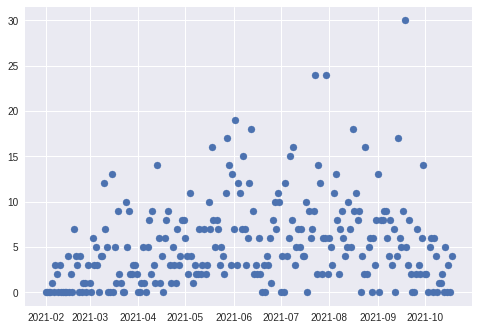

('DME-GDZ', 'auto_checkin')


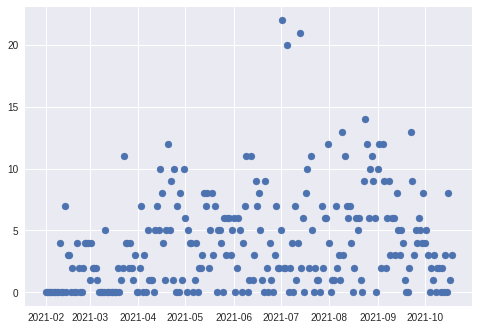

('DME-ORY', 'seat')


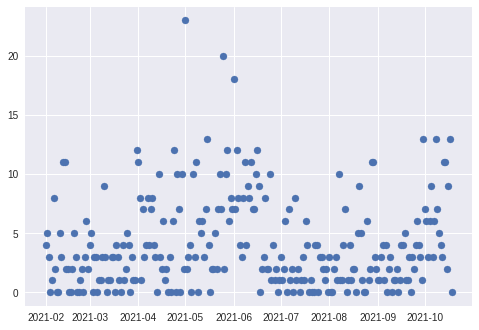

In [15]:
[('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')]

for col in [('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')]: #low_data_cols:
    print(col)
    plt.scatter(tbl.index, tbl[col])
    plt.show()

100%|██████████| 6/6 [01:57<00:00, 19.50s/it]


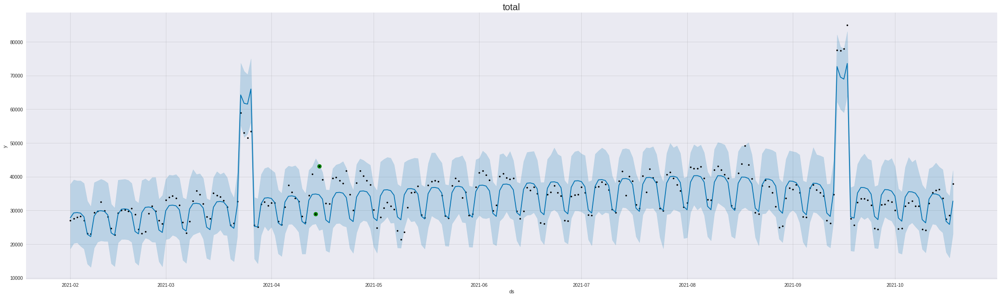

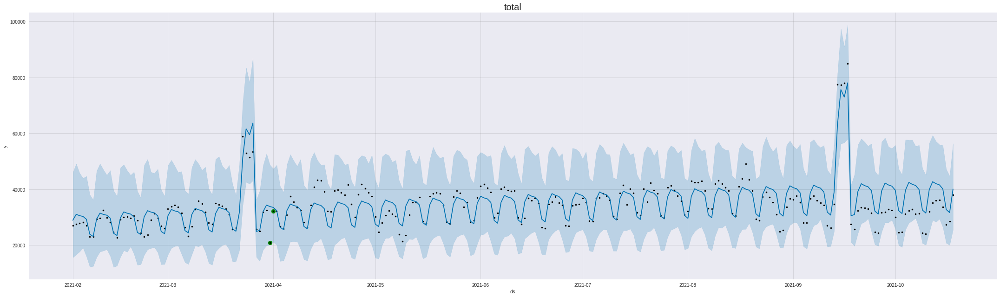

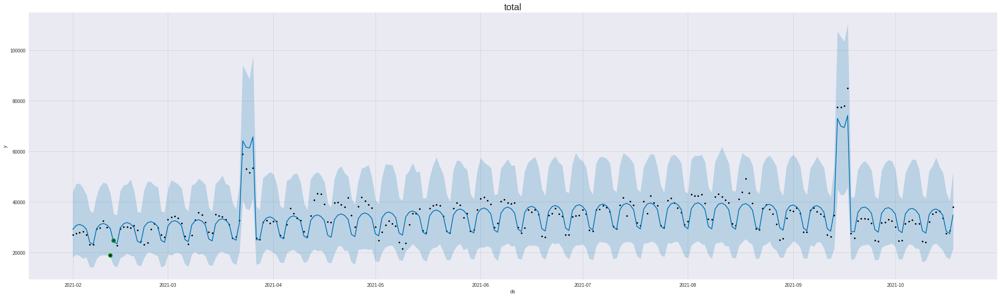

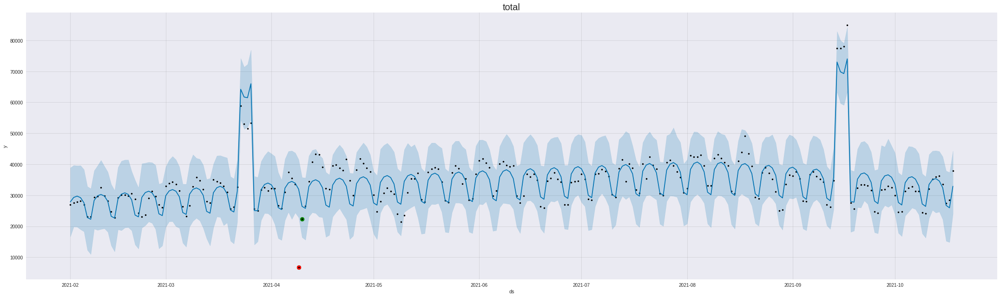

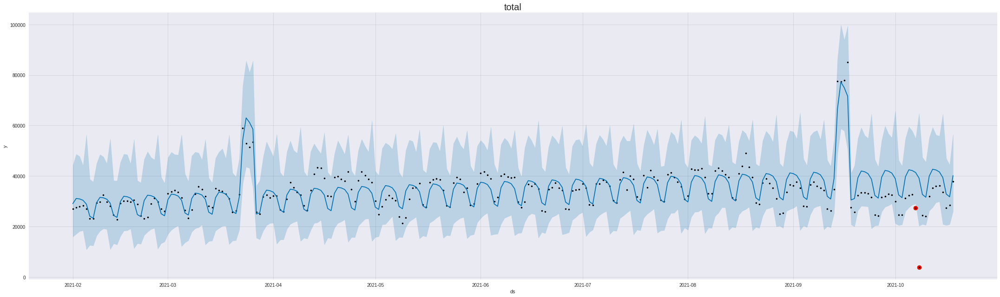

...

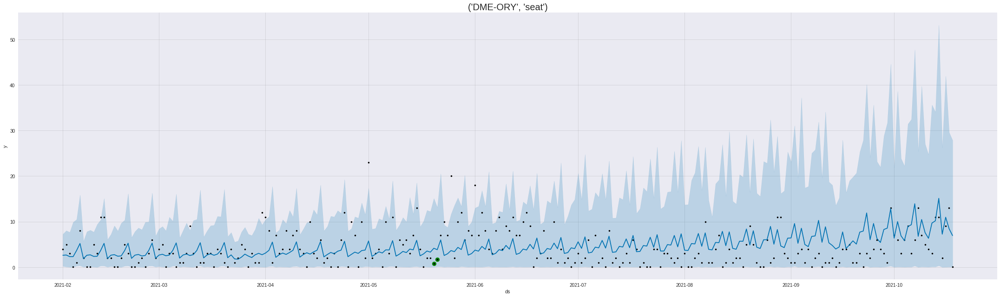

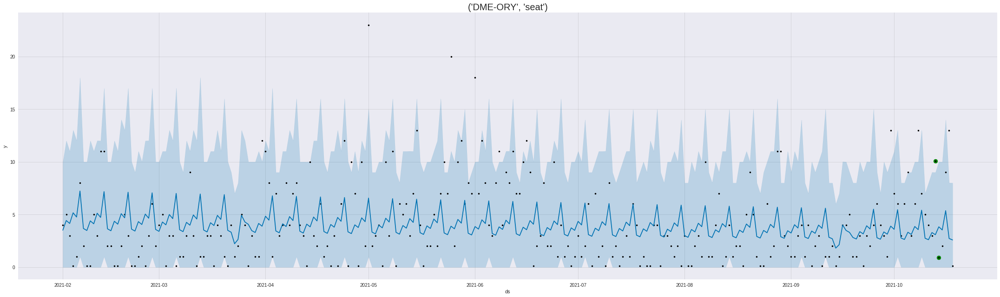

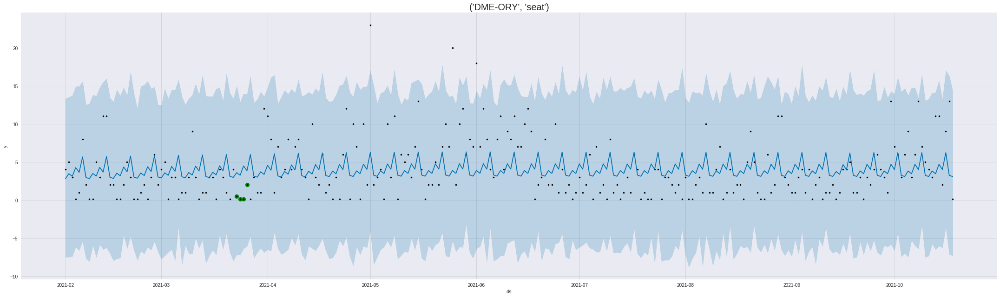

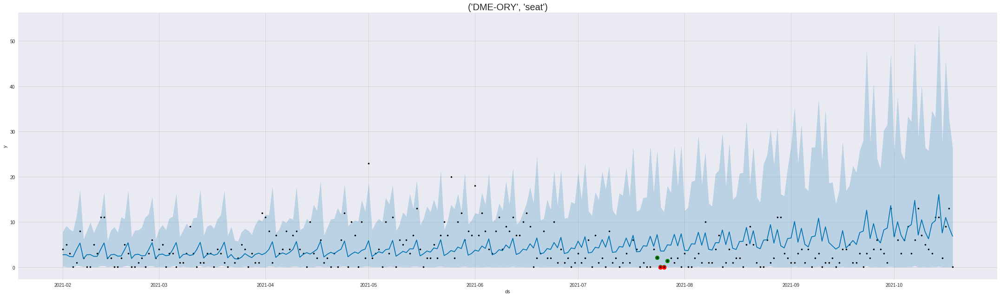

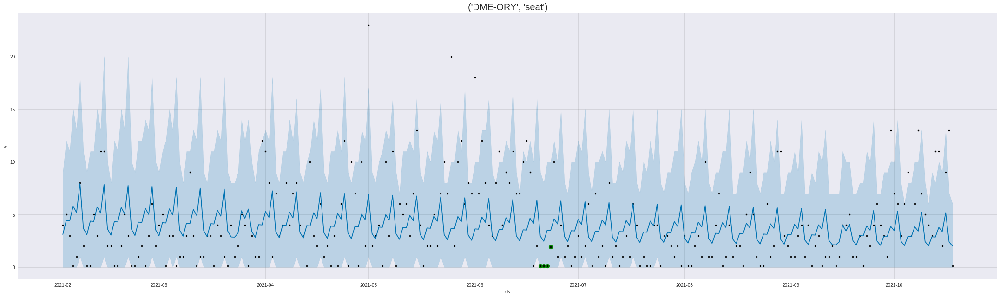

In [19]:
n_cols = ['total', 'seat', 'gift_certificate', ('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')] # ('SPU-DME', 'seat'), ('RHO-DME', 'meal')]
scenarios = [{'anom_coeff': 2/3,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 3,
              'in_a_row': True
             }
]

for target in tqdm.tqdm(n_cols):
    for params in scenarios:
        for m in [Prophet, ProphetGamma, ProphetNB]:
            try:
                validate_anomalies(m, target, to_plot=True, **params)
                #conduct_experiments(m, target, n_experiments=25, **params)
            except:
                pass

100%|██████████| 6/6 [1:26:02<00:00, 860.41s/it]


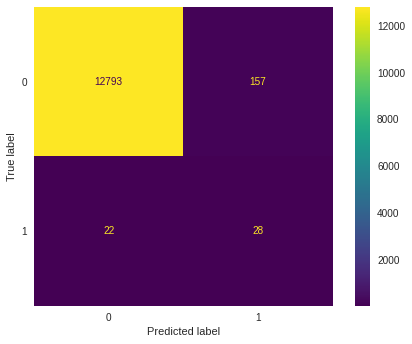

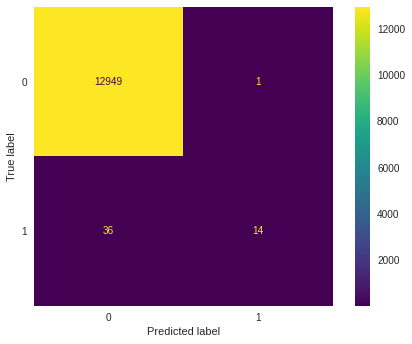

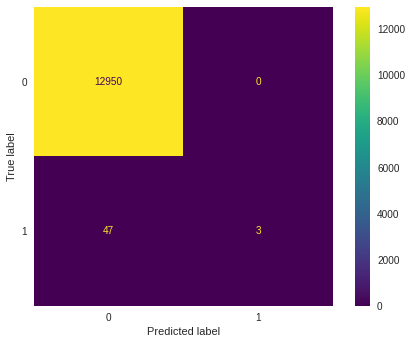

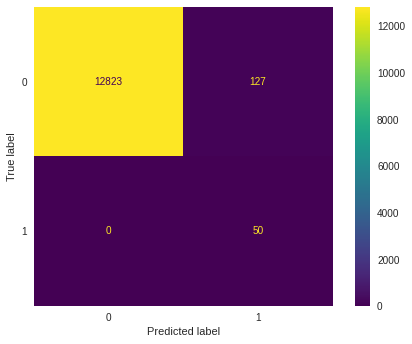

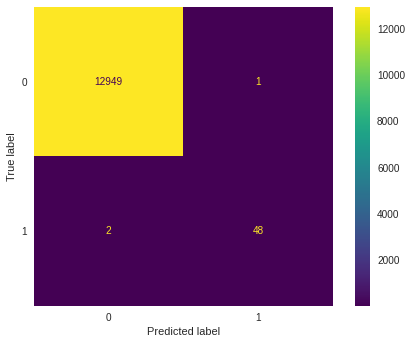

...

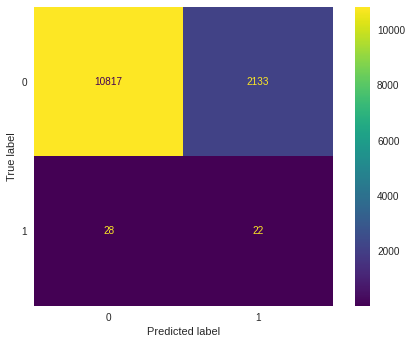

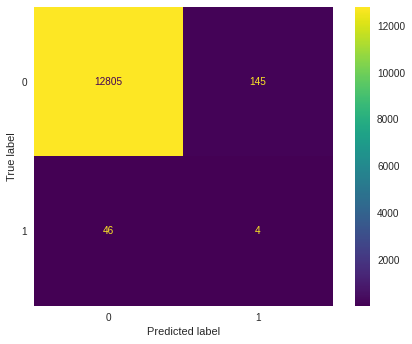

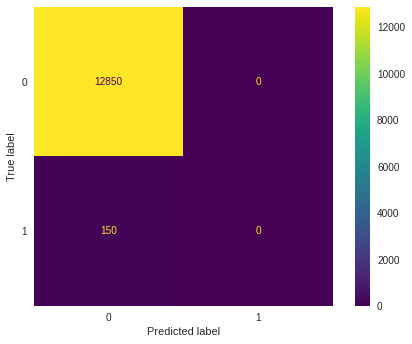

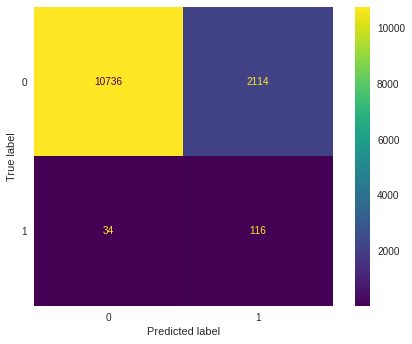

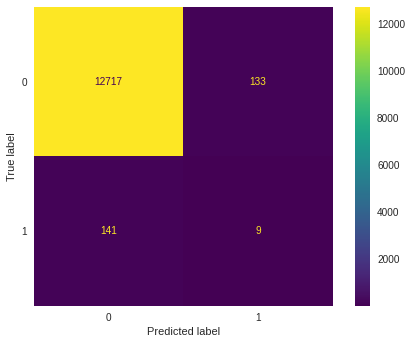

In [20]:
n_cols = ['total', 'seat', 'gift_certificate', ('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')] # ('SPU-DME', 'seat'), ('RHO-DME', 'meal')]
scenarios = [{'anom_coeff': 2/3,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 3,
              'in_a_row': True
             }
]

for target in tqdm.tqdm(n_cols):
    for params in scenarios:
        for m in [Prophet, ProphetGamma, ProphetNB]:
            try:
                #validate_anomalies(m, target, to_plot=True, **params)
                conduct_experiments(m, target, n_experiments=50, **params)
            except:
                pass

100%|██████████| 6/6 [39:29<00:00, 394.92s/it]


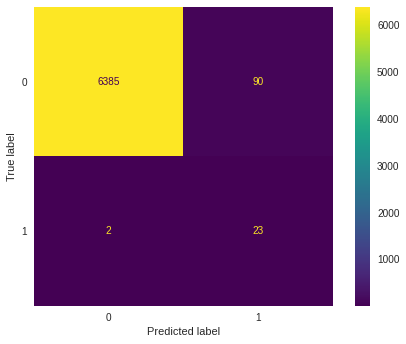

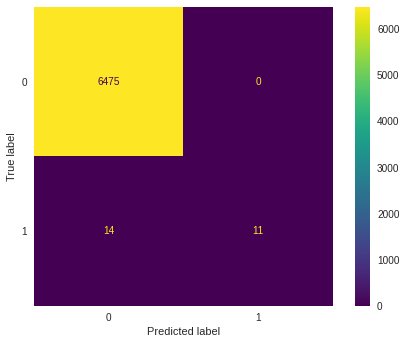

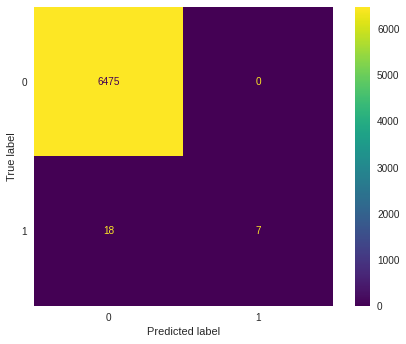

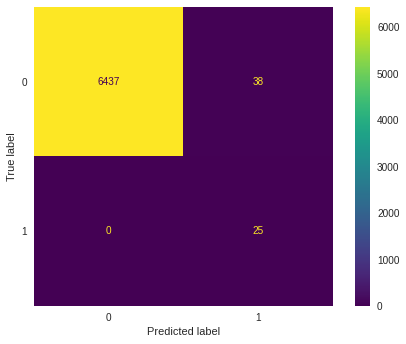

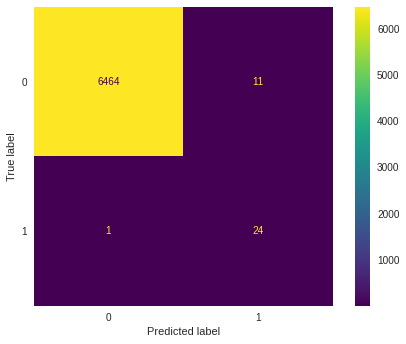

...

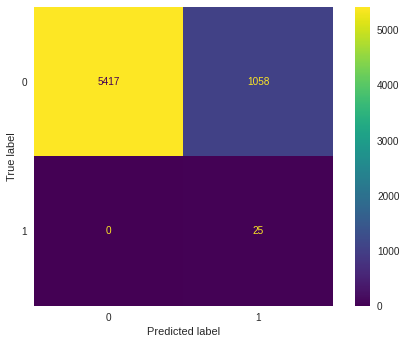

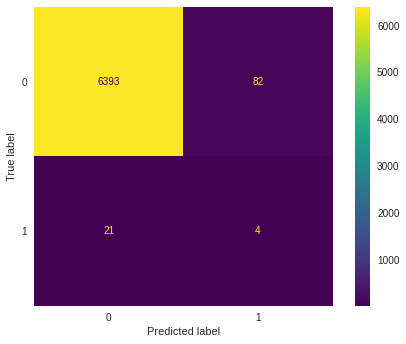

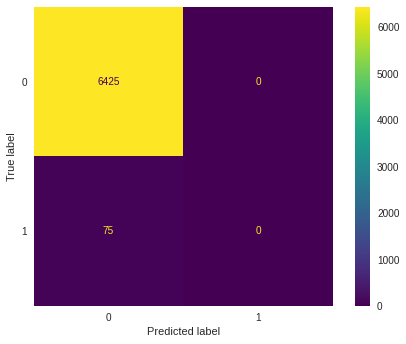

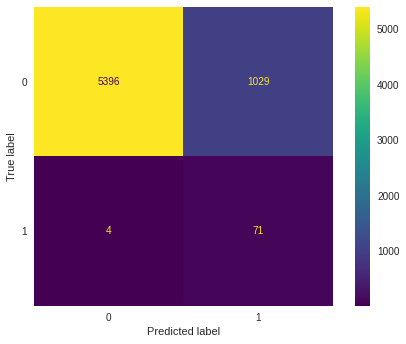

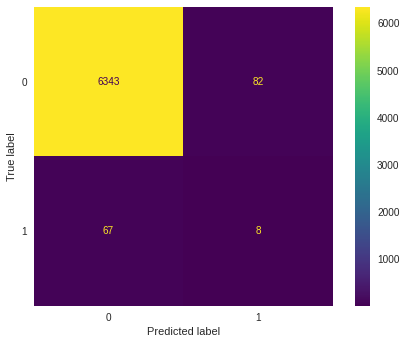

In [100]:
PROPHET_WIDTH = 0.995
GAMMA_WIDTH = 0.88
NB_WIDTH = 0.96

n_cols = ['total', 'seat', 'gift_certificate', ('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')] # ('SPU-DME', 'seat'), ('RHO-DME', 'meal')]
scenarios = [{'anom_coeff': 2/3,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 3,
              'in_a_row': True
             }
]

for target in tqdm.tqdm(n_cols):
    for params in scenarios:
        for m in [Prophet, ProphetGamma, ProphetNB]:
            try:
                #validate_anomalies(m, target, to_plot=True, **params)
                conduct_experiments(m, target, n_experiments=25, **params)
            except:
                pass

100%|██████████| 6/6 [39:32<00:00, 395.40s/it]


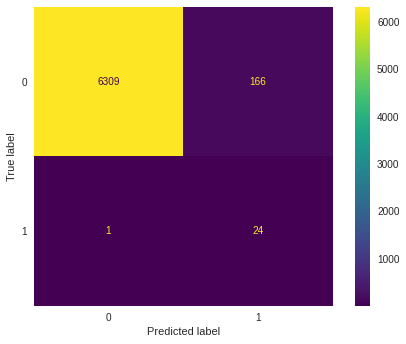

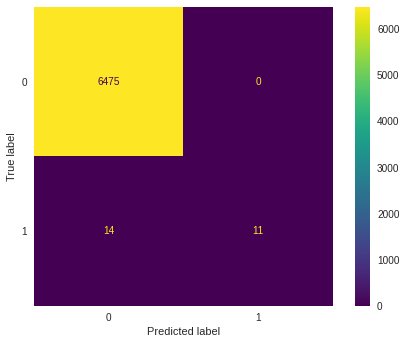

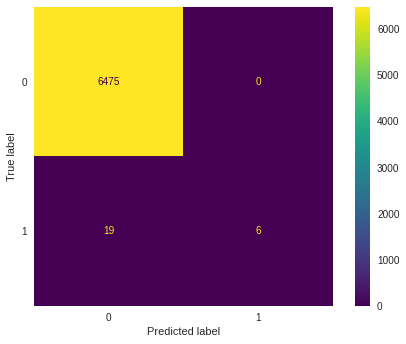

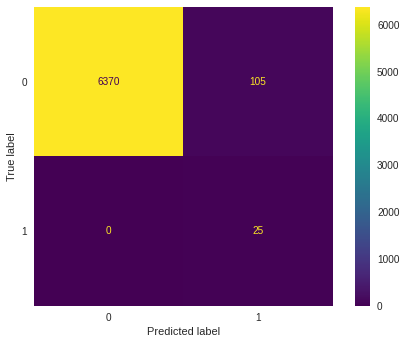

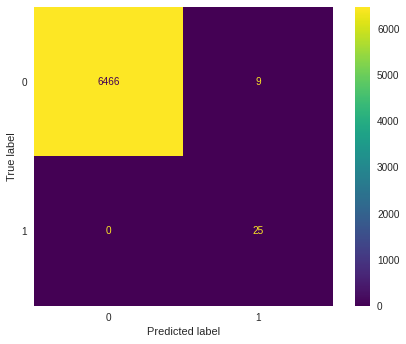

...

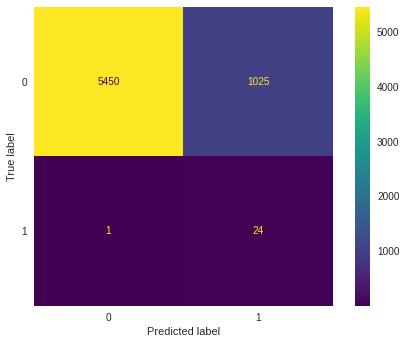

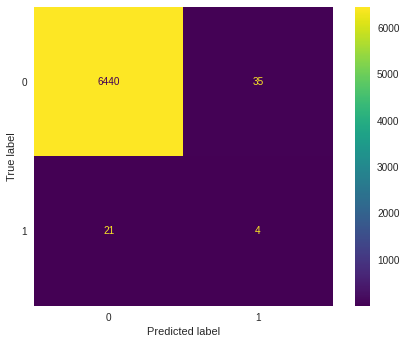

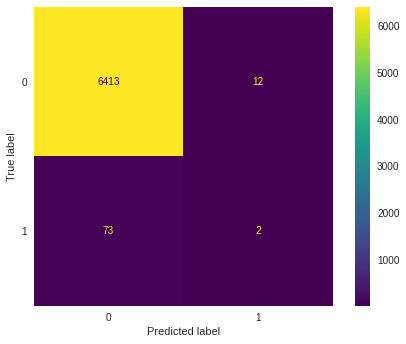

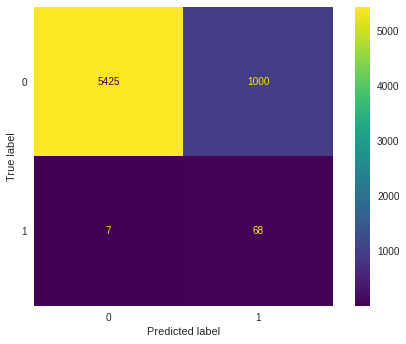

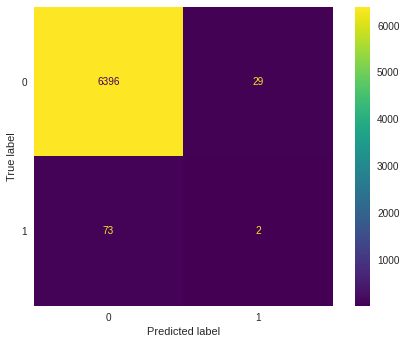

In [102]:
PROPHET_WIDTH = 0.97
GAMMA_WIDTH = 0.91
NB_WIDTH = 0.97

n_cols = ['total', 'seat', 'gift_certificate', ('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')] # ('SPU-DME', 'seat'), ('RHO-DME', 'meal')]
scenarios = [{'anom_coeff': 2/3,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 3,
              'in_a_row': True
             }
]

for target in tqdm.tqdm(n_cols):
    for params in scenarios:
        for m in [Prophet, ProphetGamma, ProphetNB]:
            try:
                #validate_anomalies(m, target, to_plot=True, **params)
                conduct_experiments(m, target, n_experiments=25, **params)
            except:
                pass

In [17]:
reports = pd.read_csv('f1_reports.csv')

### 1

In [32]:
reports.head()

,model,target_col,anom_coeff,num_anomalies,in_a_row,interval_width,f1_score
0,fbprophet,total,0.666667,1,False,0.99,0.269231
1,fbprophetGamma,total,0.666667,1,False,0.90,0.717949
2,fbprophetNB,total,0.666667,1,False,0.95,0.611111
3,fbprophet,total,0.000000,1,False,0.99,0.476190
4,fbprophetGamma,total,0.000000,1,False,0.90,0.888889


In [43]:
for params in scenarios:
    print(f'Params = {params}')
    score_max = 0
    w_max = 0
    for m, color in [('fbprophet', 'blue'), ('fbprophetGamma', 'red'), ('fbprophetNB', 'green')]:
        print('\033[95m' + f'\tModel = {m}' + '\033[0m')
        a = reports[(reports.model == m) & 
                         (reports.num_anomalies == params['num_anomalies']) & 
                         (reports.anom_coeff == params['anom_coeff'])]
        a = a.groupby('interval_width')[['f1_score']].mean().reset_index()
        for i, x in a.iterrows():
            print(f'\t\tWidth = {x.interval_width}\tF1 = {x.f1_score}')
            if x.f1_score >= score_max:
                score_max = x.f1_score
                w_max = x.interval_width
        print('\t' + '\033[1m' + f'BEST Width = {w_max}\tBEST F1 = {score_max}' + '\033[0m')
    print('\n')

Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
	Model = fbprophet
		Width = 0.97	F1 = 0.06997283508911417
		Width = 0.98	F1 = 0.0741358384983833
		Width = 0.99	F1 = 0.06184615384615384
		Width = 0.995	F1 = 0.11988304093567252
	BEST Width = 0.995	BEST F1 = 0.11988304093567252
	Model = fbprophetGamma
		Width = 0.88	F1 = 0.20234636295747158
		Width = 0.9	F1 = 0.15273089748600616
		Width = 0.91	F1 = 0.20395935030015835
		Width = 0.92	F1 = 0.11935696829465335
	BEST Width = 0.91	BEST F1 = 0.20395935030015835
	Model = fbprophetNB
		Width = 0.94	F1 = 0.2547095577192719
		Width = 0.95	F1 = 0.13518919140667124
		Width = 0.96	F1 = 0.09955734243014946
		Width = 0.97	F1 = 0.13298117880402288
	BEST Width = 0.94	BEST F1 = 0.2547095577192719


Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
	Model = fbprophet
		Width = 0.97	F1 = 0.1879056356854836
		Width = 0.98	F1 = 0.1706122263720303
		Width = 0.99	F1 = 0.11846584787761258
		Width = 0.995	F1 = 0.

Optimal interval_width:
- fbprophet --> 0.995
- fbprophetGamma --> 0.91
- fbprophetNB --> 0.97

Target = total	Model = fbprophet	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = total	Model = fbprophetGamma	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = total	Model = fbprophetNB	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}


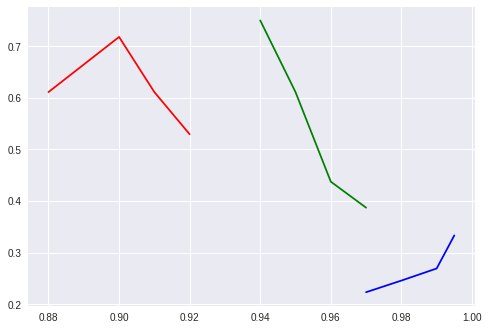

Target = total	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = total	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = total	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}


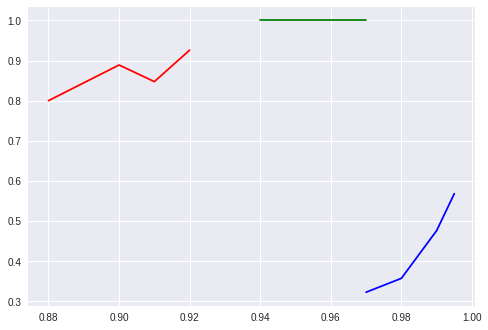

Target = total	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = total	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = total	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}


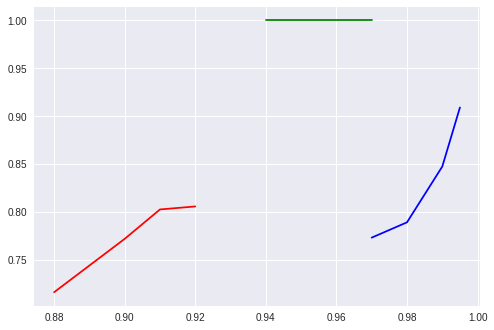

Target = seat	Model = fbprophet	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = seat	Model = fbprophetGamma	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = seat	Model = fbprophetNB	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}


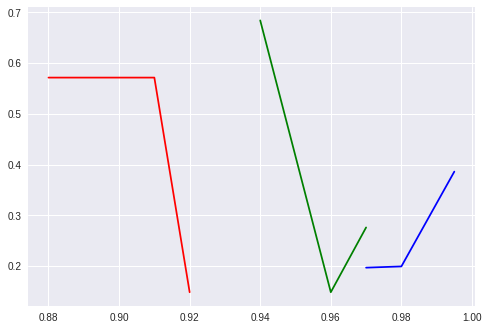

Target = seat	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = seat	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = seat	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}


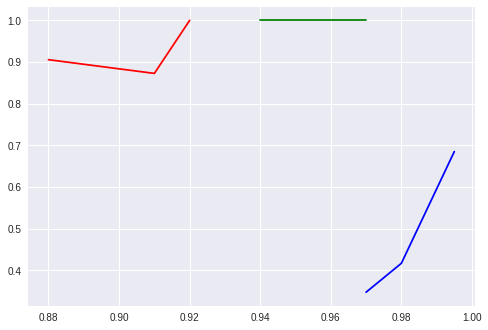

Target = seat	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = seat	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = seat	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}


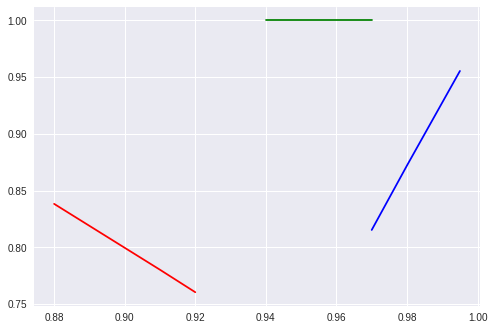

Target = gift_certificate	Model = fbprophet	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = gift_certificate	Model = fbprophetGamma	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = gift_certificate	Model = fbprophetNB	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}


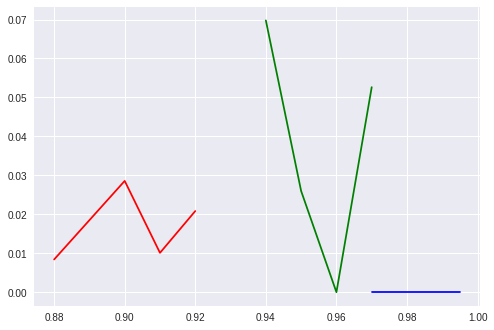

Target = gift_certificate	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = gift_certificate	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = gift_certificate	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}


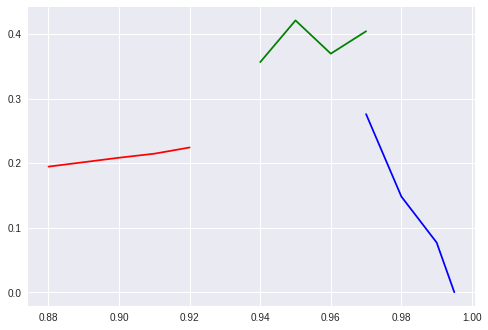

Target = gift_certificate	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = gift_certificate	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = gift_certificate	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}


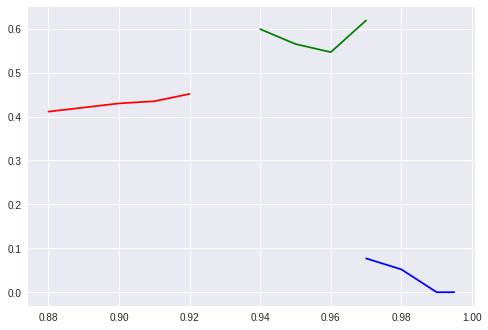

Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophet	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophetGamma	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophetNB	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}


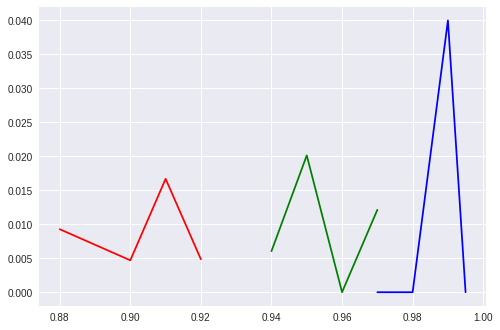

Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}


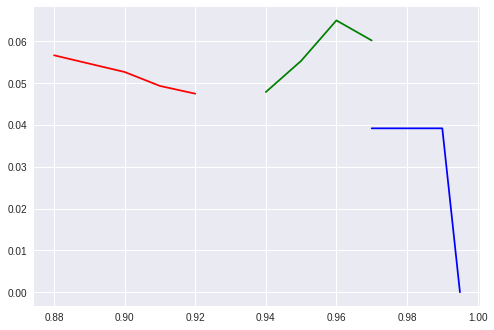

Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = ('AAQ-DME', 'auto_checkin')	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}


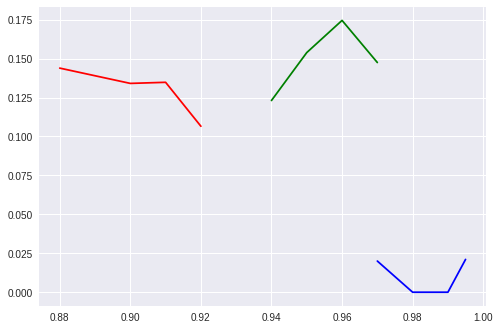

Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophet	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophetGamma	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophetNB	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}


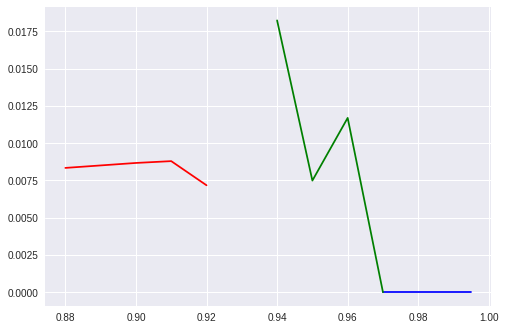

Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}


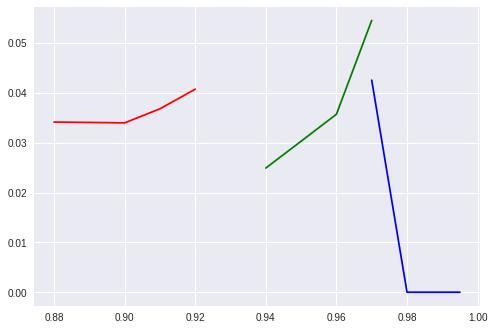

Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = ('DME-GDZ', 'auto_checkin')	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}


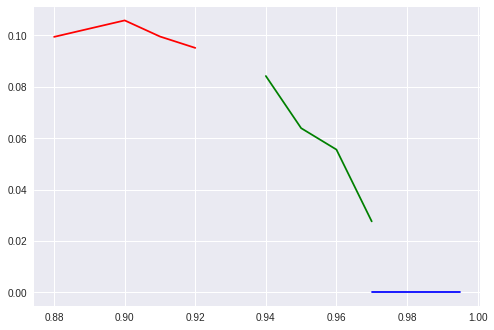

Target = ('DME-ORY', 'seat')	Model = fbprophet	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-ORY', 'seat')	Model = fbprophetGamma	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-ORY', 'seat')	Model = fbprophetNB	Params = {'anom_coeff': 0.6666666666666666, 'num_anomalies': 1, 'in_a_row': False}


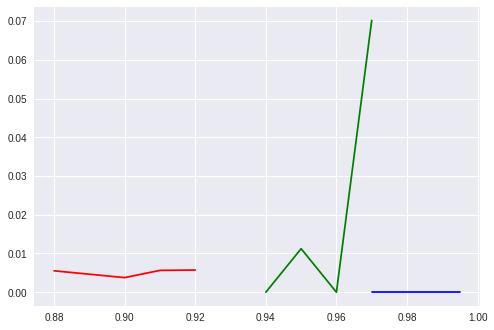

Target = ('DME-ORY', 'seat')	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-ORY', 'seat')	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}
Target = ('DME-ORY', 'seat')	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 1, 'in_a_row': False}


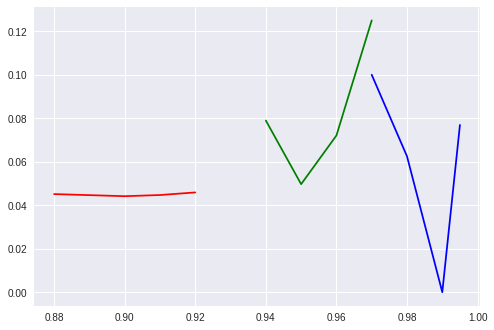

Target = ('DME-ORY', 'seat')	Model = fbprophet	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = ('DME-ORY', 'seat')	Model = fbprophetGamma	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}
Target = ('DME-ORY', 'seat')	Model = fbprophetNB	Params = {'anom_coeff': 0, 'num_anomalies': 3, 'in_a_row': True}


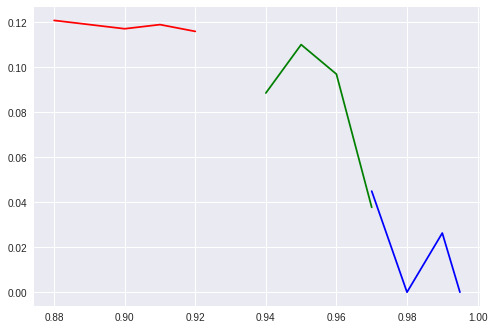

In [33]:
n_cols = ['total', 'seat', 'gift_certificate', ('AAQ-DME', 'auto_checkin'), ('DME-GDZ', 'auto_checkin'), ('DME-ORY', 'seat')] # ('SPU-DME', 'seat'), ('RHO-DME', 'meal')]
scenarios = [{'anom_coeff': 2/3,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 1,
              'in_a_row': False
             },
             {'anom_coeff': 0,
              'num_anomalies': 3,
              'in_a_row': True
             }
]

for target in n_cols:
    for params in scenarios:
        for m, color in [('fbprophet', 'blue'), ('fbprophetGamma', 'red'), ('fbprophetNB', 'green')]:
            print(f'Target = {target}\tModel = {m}\tParams = {params}')
            a = reports[(reports.model == m) & 
                             (reports.target_col == str(target)) & 
                             (reports.num_anomalies == params['num_anomalies']) & 
                             (reports.anom_coeff == params['anom_coeff'])].sort_values('interval_width')
            plt.plot(a.interval_width, a.f1_score, color=color)
        plt.show()

# Попробуем применить для этой задачки библиотеку scikit-hts

In [17]:
import hts

def make_hierarhy(df, all_cols):
    if len(all_cols) == 0:
        return {'total': 'total'}
    
    simple_cols = [col for col in all_cols if type(col) is str and col not in ['total', 'sum_seg_count']]
    hierarhy = {'total': simple_cols}
    tuple_check = tuple in [type(col) for col in all_cols]
    if tuple_check:
        for c in simple_cols:
            hierarhy[c] = [col for col in all_cols if col[1] == c]
    return hierarhy


def hts_fit_predict(df, all_cols, hierarchy, model='prophet', revision_method='OLS'):
    grouped_df = df.copy()
    
    reg = hts.HTSRegressor(
        model=model, 
        revision_method=revision_method, # "OLS", "WLSS", "WLSV", "FP", "PHA", "AHP", "BU", "NONE"
        weekly_seasonality = True,
        #daily_seasonality = True,
        #yearly_seasonality = True,
        holidays=sales,
        interval_width=0.99,
        n_jobs=0,
    )
    reg = reg.fit(df=grouped_df, nodes=hierarchy)
    preds = reg.predict(steps_ahead=1)
    return preds


def plot_results(df, preds, hierarchy):
    PLOT = ['total'] + [item for sublist in hierarchy.values() for item in sublist]
    quantile_1 = (preds - df).quantile(0.01, axis=0)
    quantile_99 = (preds - df).quantile(0.99, axis=0)
    
    
    os.makedirs('./hts_reports',exist_ok=True)
    for i, group in enumerate(PLOT):
        anomalies = df[group] < (preds[group] - abs(quantile_1[group]))[df.index]
        anomalies = df.loc[anomalies[anomalies].index, :]
        plt.figure(figsize=(30,9))
        ax=plt.gca()
        ax.plot(df[group], 
                    color='#2ecc71',  
                    label='Truth')
#         ax.scatter(df.index,
#                    df[group], 
#                     c='k')
        ax.plot(preds[group], 
                    color='#2563cc',
                    label='Prediction')
        
        ax.fill_between(preds.index, 
                            preds[group] - abs(quantile_1[group]),
                            preds[group] + abs(quantile_99[group]),
                            color='#9ec2ff',
                            alpha=0.4,)
        
        ax.scatter(anomalies.index, anomalies[group], c='r', marker='o')
        ax.legend()
        ax.set_title(f'{group}')
        plt.savefig(f'./hts_reports/{group}.png')

In [18]:
tbl_normalized = tbl.copy()
for c in ['total'] + all_cols:
    tbl_normalized[c] = tbl_normalized[c] / tbl_normalized.sum_seg_count
tbl_normalized = tbl_normalized[['total'] + all_cols]

In [19]:
basic_hierarchy = make_hierarhy(tbl_normalized, all_cols)
preds = hts_fit_predict(tbl_normalized, all_cols, basic_hierarchy)

Fitting models:   0%|          | 0/15 [00:00<?, ?it/s]INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
Fitting models:  13%|█▎        | 2/15 [00:00<00:00, 14.23it/s]INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
Fitting models:  27%|██▋       | 4/15 [00:00<00:00, 16.99it/

In [20]:
preds

,total,aeroexpress,auto_checkin,bag,car,free_refund,hotel,insurance,meal,other,prepay,seat,sms,transfer,upgrade
2021-06-01,0.287342,0.002653,0.001426,0.018384,0.000305,-0.002469,0.009537,0.065680,0.009527,0.003045,0.002997,0.154643,0.019528,0.000299,0.001787
2021-06-02,0.299606,0.002913,0.001502,0.019112,0.000319,-0.001795,0.010025,0.067889,0.009996,0.003139,0.003145,0.160373,0.020474,0.000353,0.002162
2021-06-03,0.309135,0.003064,0.001722,0.019949,0.000402,-0.001672,0.010725,0.068319,0.010750,0.003197,0.003143,0.166493,0.020336,0.000380,0.002325
2021-06-04,0.295430,0.003074,0.001614,0.019128,0.000371,-0.001899,0.009824,0.066016,0.010437,0.003067,0.002805,0.158024,0.020237,0.000341,0.002390
2021-06-05,0.342968,0.003616,0.001827,0.022595,0.000482,-0.001044,0.010547,0.074363,0.012565,0.003759,0.003241,0.184224,0.022621,0.000468,0.003705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-22,0.314773,0.007380,0.002457,0.017569,0.000647,0.011331,0.019889,0.059580,0.010582,0.002644,0.001180,0.152805,0.024846,0.000387,0.003477
2021-10-23,0.360822,0.007912,0.002668,0.020935,0.000760,0.012136,0.020608,0.067557,0.012640,0.003326,0.001617,0.178142,0.027215,0.000511,0.004795
2021-10-24,0.406555,0.008654,0.002813,0.023888,0.000822,0.013087,0.024414,0.075976,0.013778,0.003695,0.001964,0.202041,0.030036,0.000593,0.004794
2021-10-25,0.312481,0.007215,0.002326,0.017048,0.000766,0.011159,0.019849,0.059833,0.009773,0.002675,0.001435,0.152157,0.025001,0.000375,0.002869


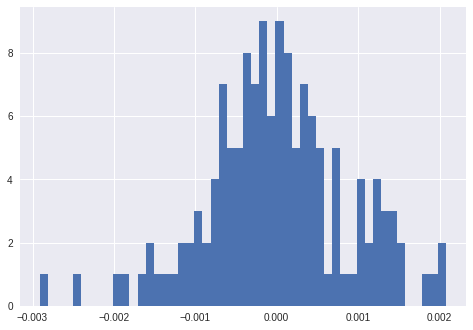

In [21]:
(tbl_normalized - preds)['aeroexpress'].hist(bins=50);

In [22]:
(preds - tbl_normalized).quantile(0.01, axis=0)

total          -0.068495
aeroexpress    -0.001961
auto_checkin   -0.001111
bag            -0.004994
car            -0.000725
free_refund    -0.003673
hotel          -0.012655
insurance      -0.014992
meal           -0.003281
other          -0.000880
prepay         -0.001170
seat           -0.035115
sms            -0.004108
transfer       -0.000310
upgrade        -0.001426
Name: 0.01, dtype: float64

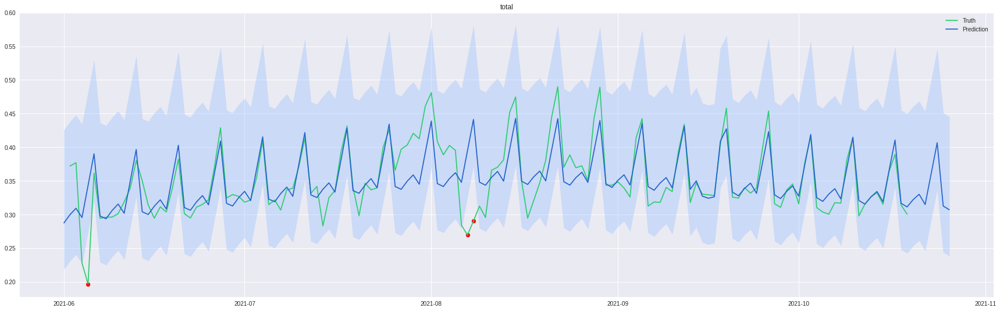

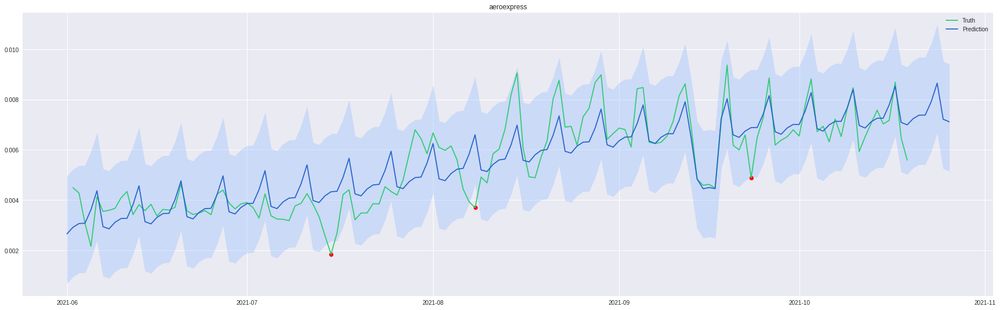

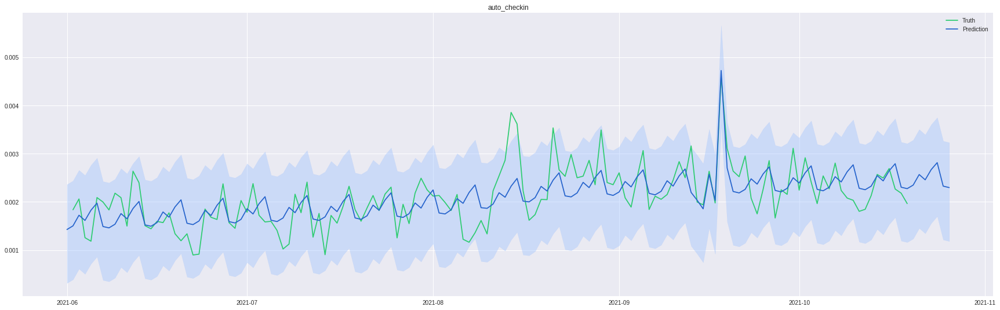

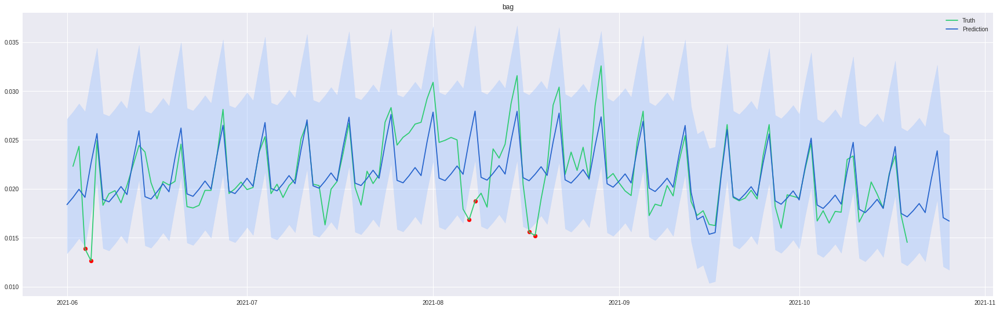

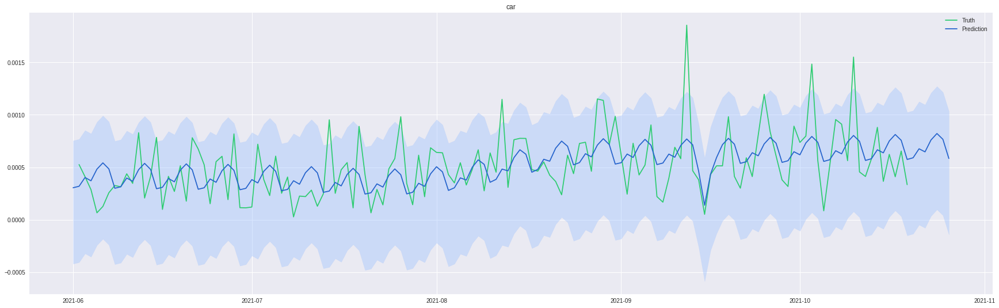

...

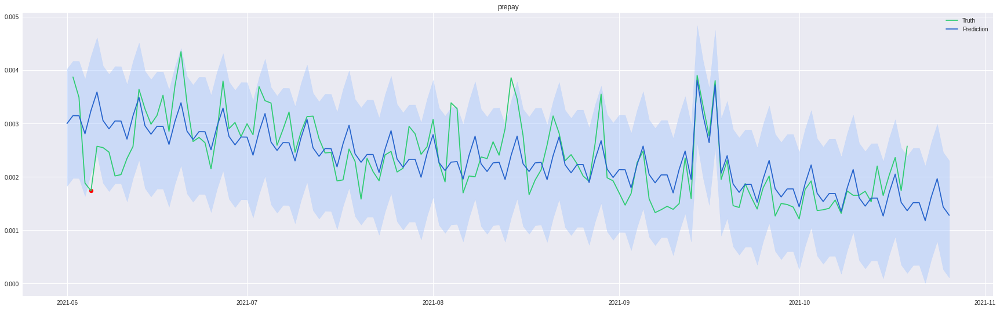

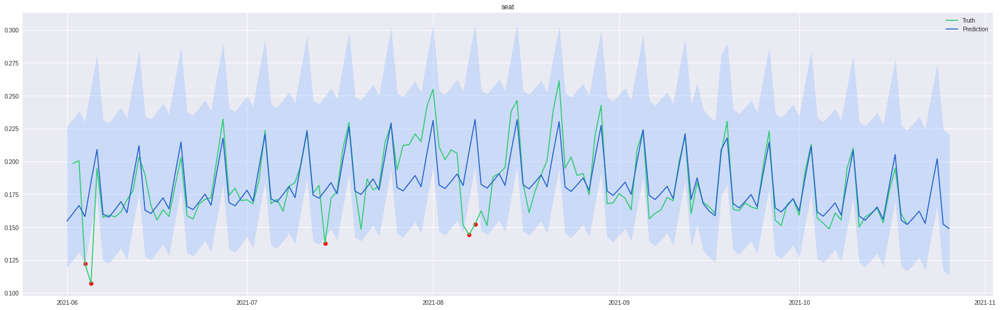

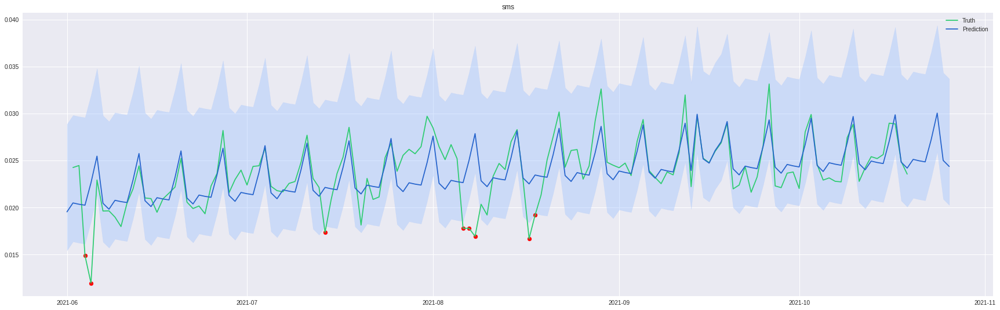

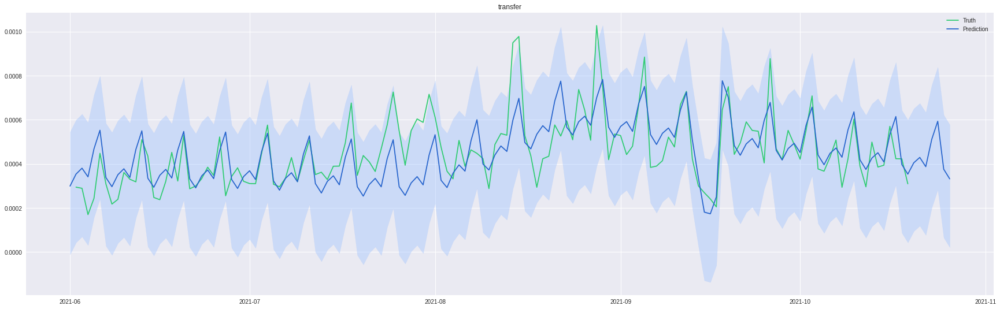

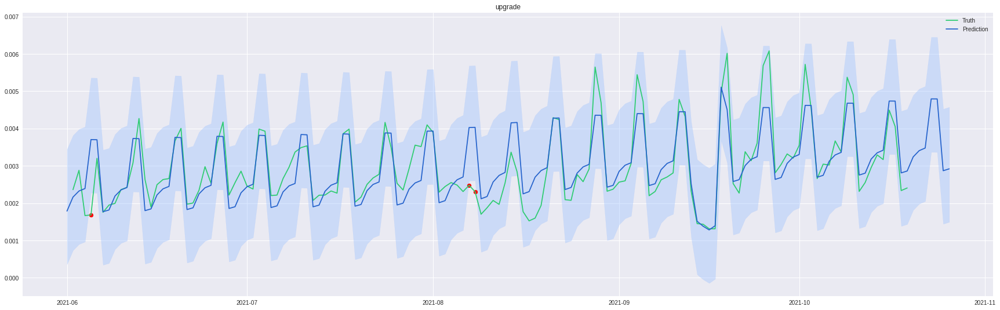

In [23]:
plot_results(tbl_normalized, preds, basic_hierarchy)

In [38]:
(prophet_preds - preds[all_cols]).multiply(tbl.sum_seg_count, axis=0).mean()

aeroexpress     0.751637
auto_checkin    0.751637
bag             0.751637
car             0.751637
free_refund     0.751637
hotel           0.751637
insurance       0.751637
meal            0.751637
other           0.751637
prepay          0.751637
seat            0.751637
sms             0.751637
transfer        0.751637
upgrade         0.751637
dtype: float64